In [1]:
import random
import math

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.optim as optim
import matplotlib.pyplot as plt
from tqdm import tqdm

from Models import JointAutoregressiveHierarchical, ScalableImageCoding
from Dataloader import PreprocessedDataset, KodakDataset
from RateDistortionLoss import rd_loss, vision_rd_loss
from Evaluator import VisionCompressionEvaluator
from utils import FirstHalf, FrozenActivationBlock, plot_information_evolution, plot_metric_evolution

### Prepare Dataset

In [2]:
transform_train = transforms.Compose([
    transforms.ToTensor(),  # convert to [0,1]
])

preprocessed_dir = "./data/coco_preprocessed"
train_dataset = PreprocessedDataset(preprocessed_dir, transform=transform_train)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)

### Prepare Vison Model and Activation Block

In [3]:
from ultralytics import YOLO
import torch
import torch.nn as nn

device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the pretrained YOLOv3 model
yolo = YOLO("yolov3.pt")

PRO TIP  Replace 'model=yolov3.pt' with new 'model=yolov3u.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



In [4]:
# Prepare the Vison Model 
V = FirstHalf(yolo, cut_layer=5)
# Freeze the Vison Model  
for param in V.parameters():
    param.requires_grad = False

# Prepare the activation block
activation_block = FrozenActivationBlock(yolo, cut_layer=5)

In [5]:
# Delete the full YOLO model to save RAM
del yolo

In [6]:
V.to(device)
activation_block.to(device)

FrozenActivationBlock(
  (frozen_bn): BatchNorm2d(256, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
  (act): SiLU(inplace=True)
)

### Training

Training:   1%|▊                                                                 | 500/40000 [05:17<6:58:06,  1.57it/s]


[Step 500] Loss: 5.6457 | 
MSE: 0.009861 | Reconstruction MSE: 0.009849 | PSNR: 20.065884 | Vision MSE: 0.117474 | 
BPP: 0.596803 | Ry1: 0.234124 | Ry2: 0.133154 | Ry: 0.367278 | Rz: 0.229525 | 
Total Bits: 39112.0664 | Base Bits: 15343.5625 | Enhacement Bits: 8726.3535 | Side Information Bits: 15042.1523
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0148 | std: 0.4618 | range: -4.1009 - 4.3317
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0157 | std: 0.5450 | range: -4.3523 - 4.2199
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0217 | std: 0.5489 | range: -3.2955 - 4.0100
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0035 | std: 0.5369 | range: -4.3523 - 4.2199
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2281 | std: 0.7264 | range: -6.0492 -

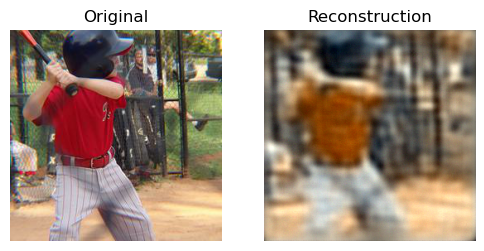

Training:   2%|█▋                                                               | 1000/40000 [10:36<6:55:54,  1.56it/s]


[Step 1000] Loss: 4.7283 | 
MSE: 0.008090 | Reconstruction MSE: 0.008078 | PSNR: 20.926697 | Vision MSE: 0.112077 | 
BPP: 0.586383 | Ry1: 0.240071 | Ry2: 0.137380 | Ry: 0.377451 | Rz: 0.208932 | 
Total Bits: 38429.1875 | Base Bits: 15733.2949 | Enhacement Bits: 9003.3525 | Side Information Bits: 13692.5430
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0197 | std: 0.6437 | range: -7.1336 - 7.2140
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0201 | std: 0.7058 | range: -7.3416 - 7.0437
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0298 | std: 0.7103 | range: -7.3416 - 7.0437
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0006 | std: 0.6964 | range: -6.0857 - 6.4674
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2554 | std: 0.8062 | range: -6.8139 

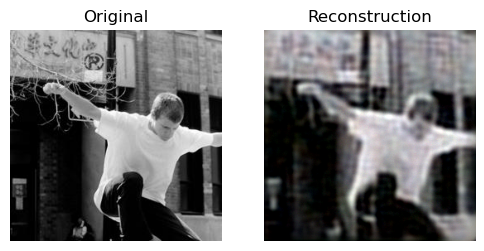

Training:   4%|██▍                                                              | 1500/40000 [15:56<6:51:36,  1.56it/s]


[Step 1500] Loss: 3.3719 | 
MSE: 0.005471 | Reconstruction MSE: 0.005460 | PSNR: 22.627697 | Vision MSE: 0.106995 | 
BPP: 0.570714 | Ry1: 0.245613 | Ry2: 0.136182 | Ry: 0.381795 | Rz: 0.188919 | 
Total Bits: 37402.3359 | Base Bits: 16096.4805 | Enhacement Bits: 8924.8496 | Side Information Bits: 12381.0098
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.9424 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -17.3287 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0143 | std: 0.6763 | range: -7.9224 - 9.4464
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0145 | std: 0.7350 | range: -8.0457 - 9.8906
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0253 | std: 0.7375 | range: -8.0457 - 9.8906
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0072 | std: 0.7296 | range: -5.9217 - 7.6865
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2604 | std: 0.8462 | range: -7.2039 -

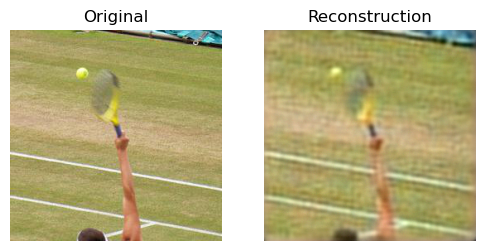

Training:   5%|███▎                                                             | 2000/40000 [21:17<6:48:01,  1.55it/s]


[Step 2000] Loss: 3.1022 | 
MSE: 0.004898 | Reconstruction MSE: 0.004887 | PSNR: 23.109682 | Vision MSE: 0.110523 | 
BPP: 0.594491 | Ry1: 0.273228 | Ry2: 0.151536 | Ry: 0.424764 | Rz: 0.169727 | 
Total Bits: 38960.5547 | Base Bits: 17906.2617 | Enhacement Bits: 9931.0830 | Side Information Bits: 11123.2109
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0159 | std: 0.7509 | range: -10.8941 - 12.8333
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0155 | std: 0.8041 | range: -10.8158 - 13.1089
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0223 | std: 0.8177 | range: -10.8158 - 13.1089
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0018 | std: 0.7759 | range: -7.8958 - 10.8186
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2665 | std: 0.8505 | range: -

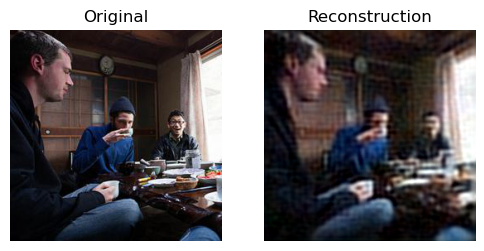

Training:   6%|████                                                             | 2500/40000 [26:37<6:41:49,  1.56it/s]


[Step 2500] Loss: 2.3151 | 
MSE: 0.003463 | Reconstruction MSE: 0.003452 | PSNR: 24.618713 | Vision MSE: 0.105514 | 
BPP: 0.542078 | Ry1: 0.252187 | Ry2: 0.138649 | Ry: 0.390836 | Rz: 0.151242 | 
Total Bits: 35525.5977 | Base Bits: 16527.3262 | Enhacement Bits: 9086.4990 | Side Information Bits: 9911.7734
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -16.2301 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.2492 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0178 | std: 0.8024 | range: -14.8736 - 14.3350
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0182 | std: 0.8523 | range: -15.1841 - 14.1206
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0319 | std: 0.8823 | range: -15.1841 - 14.1206
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0092 | std: 0.7884 | range: -7.7889 - 8.7151
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2687 | std: 0.8835 | range: -7.9

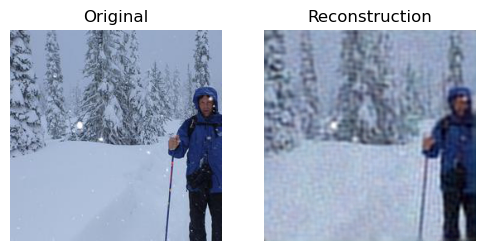

Training:   8%|████▉                                                            | 3000/40000 [31:59<6:37:05,  1.55it/s]


[Step 3000] Loss: 3.2279 | 
MSE: 0.005233 | Reconstruction MSE: 0.005222 | PSNR: 22.821903 | Vision MSE: 0.112587 | 
BPP: 0.548690 | Ry1: 0.269035 | Ry2: 0.145714 | Ry: 0.414749 | Rz: 0.133941 | 
Total Bits: 35958.9531 | Base Bits: 17631.4805 | Enhacement Bits: 9549.4902 | Side Information Bits: 8777.9805
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -17.3287 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.3033 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0099 | std: 0.8436 | range: -18.5303 - 14.1863
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0103 | std: 0.8909 | range: -18.7353 - 14.2020
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0230 | std: 0.9143 | range: -18.7353 - 14.2020
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0151 | std: 0.8416 | range: -12.6103 - 11.7027
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2704 | std: 0.9052 | range: -8

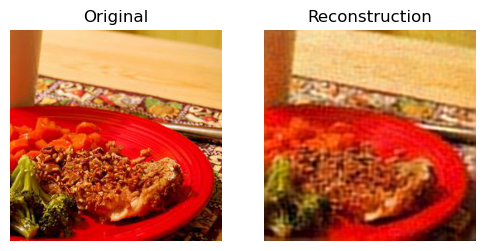

Training:   9%|█████▋                                                           | 3500/40000 [37:20<6:31:35,  1.55it/s]


[Step 3500] Loss: 3.2719 | 
MSE: 0.005305 | Reconstruction MSE: 0.005293 | PSNR: 22.762671 | Vision MSE: 0.114629 | 
BPP: 0.555781 | Ry1: 0.286438 | Ry2: 0.151952 | Ry: 0.438391 | Rz: 0.117391 | 
Total Bits: 36423.6953 | Base Bits: 18772.0195 | Enhacement Bits: 9958.3438 | Side Information Bits: 7693.3320
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -11.9816 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.9424 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0098 | std: 0.8020 | range: -15.5640 - 20.4661
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0099 | std: 0.8524 | range: -15.8537 - 20.9223
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0169 | std: 0.8776 | range: -15.8537 - 20.9223
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0040 | std: 0.7994 | range: -8.4919 - 9.9318
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2625 | std: 0.8974 | range: -8.3

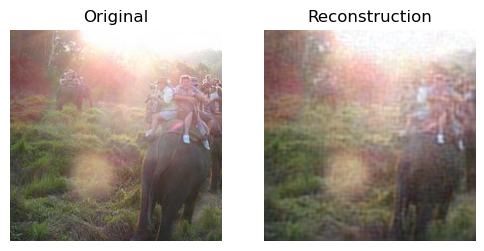

Training:  10%|██████▌                                                          | 4000/40000 [42:42<6:26:26,  1.55it/s]


[Step 4000] Loss: 2.8645 | 
MSE: 0.004426 | Reconstruction MSE: 0.004414 | PSNR: 23.551785 | Vision MSE: 0.122583 | 
BPP: 0.598272 | Ry1: 0.325264 | Ry2: 0.170540 | Ry: 0.495804 | Rz: 0.102468 | 
Total Bits: 39208.3672 | Base Bits: 21316.5234 | Enhacement Bits: 11176.5020 | Side Information Bits: 6715.3438
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -17.3287 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0105 | std: 1.0010 | range: -20.1688 - 18.7974
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0113 | std: 1.0408 | range: -20.2423 - 18.9883
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0251 | std: 1.0945 | range: -20.2423 - 18.9883
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0164 | std: 0.9233 | range: -11.2607 - 12.0592
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2764 | std: 0.9251 | range: -

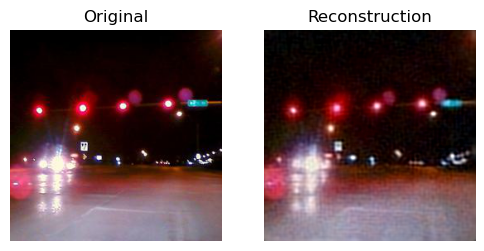

Training:  11%|███████▎                                                         | 4500/40000 [48:03<6:19:54,  1.56it/s]


[Step 4500] Loss: 1.9419 | 
MSE: 0.002808 | Reconstruction MSE: 0.002796 | PSNR: 25.534721 | Vision MSE: 0.121928 | 
BPP: 0.504108 | Ry1: 0.273442 | Ry2: 0.142406 | Ry: 0.415848 | Rz: 0.088260 | 
Total Bits: 33037.2305 | Base Bits: 17920.3125 | Enhacement Bits: 9332.7266 | Side Information Bits: 5784.1934
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.0261 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.4785 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0009 | std: 0.7437 | range: -19.9086 - 19.0994
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0012 | std: 0.7993 | range: -20.3631 - 18.7717
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0036 | std: 0.8337 | range: -20.3631 - 18.7717
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0109 | std: 0.7255 | range: -11.4677 - 9.9278
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2530 | std: 0.8798 | range: -9.30

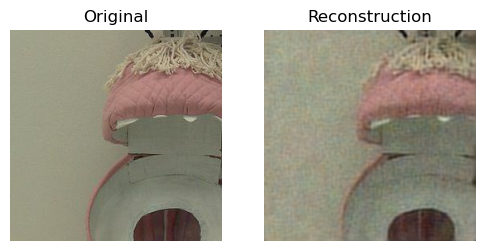

Training:  12%|████████▏                                                        | 5000/40000 [53:25<6:15:29,  1.55it/s]


[Step 5000] Loss: 3.1481 | 
MSE: 0.004964 | Reconstruction MSE: 0.004951 | PSNR: 23.052797 | Vision MSE: 0.130241 | 
BPP: 0.606393 | Ry1: 0.348885 | Ry2: 0.180807 | Ry: 0.529691 | Rz: 0.076702 | 
Total Bits: 39740.5820 | Base Bits: 22864.4980 | Enhacement Bits: 11849.3398 | Side Information Bits: 5026.7446
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.9424 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -14.9308 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0058 | std: 1.0766 | range: -21.9140 - 23.2310
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0059 | std: 1.1148 | range: -21.8770 - 23.3633
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0148 | std: 1.1641 | range: -21.8770 - 23.3633
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0119 | std: 1.0089 | range: -14.1917 - 15.1345
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2751 | std: 0.9329 | range: -

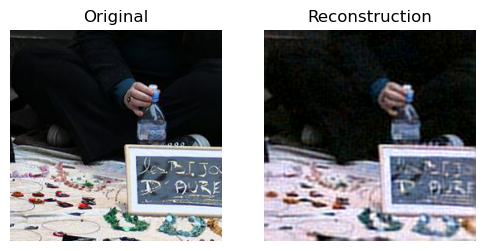

Training:  14%|████████▉                                                        | 5500/40000 [58:46<6:09:55,  1.55it/s]


[Step 5500] Loss: 2.5554 | 
MSE: 0.003835 | Reconstruction MSE: 0.003822 | PSNR: 24.176561 | Vision MSE: 0.125358 | 
BPP: 0.591898 | Ry1: 0.348058 | Ry2: 0.177798 | Ry: 0.525856 | Rz: 0.066043 | 
Total Bits: 38790.6328 | Base Bits: 22810.3047 | Enhacement Bits: 11652.1641 | Side Information Bits: 4328.1621
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.2492 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -14.8438 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0019 | std: 1.0443 | range: -26.0121 - 22.1551
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0019 | std: 1.0834 | range: -25.5593 - 22.1596
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0106 | std: 1.1376 | range: -25.5593 - 22.1596
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0155 | std: 0.9659 | range: -13.9148 - 11.7708
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2747 | std: 0.9318 | range: -

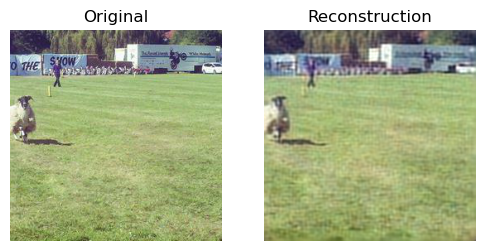

Training:  15%|█████████▍                                                     | 6000/40000 [1:04:08<6:05:09,  1.55it/s]


[Step 6000] Loss: 3.7398 | 
MSE: 0.006204 | Reconstruction MSE: 0.006191 | PSNR: 22.082413 | Vision MSE: 0.126444 | 
BPP: 0.563577 | Ry1: 0.336559 | Ry2: 0.169583 | Ry: 0.506142 | Rz: 0.057436 | 
Total Bits: 36934.6094 | Base Bits: 22056.7539 | Enhacement Bits: 11113.7588 | Side Information Bits: 3764.0947
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0003 | std: 1.0545 | range: -28.1562 - 23.3882
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0007 | std: 1.0933 | range: -27.7741 - 23.8090
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0063 | std: 1.1614 | range: -27.7741 - 23.8090
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0146 | std: 0.9423 | range: -15.0182 - 14.1632
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2613 | std: 0.8742 | range: -10

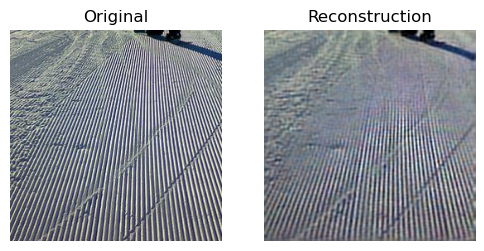

Training:  16%|██████████▏                                                    | 6500/40000 [1:09:31<6:00:54,  1.55it/s]


[Step 6500] Loss: 2.1110 | 
MSE: 0.003049 | Reconstruction MSE: 0.003036 | PSNR: 25.176445 | Vision MSE: 0.127820 | 
BPP: 0.549860 | Ry1: 0.333514 | Ry2: 0.167909 | Ry: 0.501422 | Rz: 0.048438 | 
Total Bits: 36035.6406 | Base Bits: 21857.1426 | Enhacement Bits: 11004.0537 | Side Information Bits: 3174.4429
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -14.8438 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.7452 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0100 | std: 1.0340 | range: -22.6367 - 27.7680
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0098 | std: 1.0737 | range: -22.8318 - 27.3546
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0207 | std: 1.1437 | range: -22.8318 - 27.3546
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0119 | std: 0.9174 | range: -12.5648 - 10.7512
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2561 | std: 0.8803 | range: -

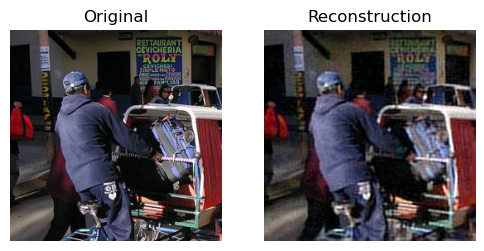

Training:  18%|███████████                                                    | 7000/40000 [1:14:54<5:55:36,  1.55it/s]


[Step 7000] Loss: 1.7651 | 
MSE: 0.002453 | Reconstruction MSE: 0.002441 | PSNR: 26.123484 | Vision MSE: 0.120183 | 
BPP: 0.508926 | Ry1: 0.310944 | Ry2: 0.155335 | Ry: 0.466279 | Rz: 0.042647 | 
Total Bits: 33353.0078 | Base Bits: 20378.0078 | Enhacement Bits: 10180.0596 | Side Information Bits: 2794.9385
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.7192 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0088 | std: 1.0479 | range: -27.4311 - 23.1860
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0088 | std: 1.0869 | range: -27.7306 - 22.8042
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0230 | std: 1.1707 | range: -27.7306 - 22.8042
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0195 | std: 0.8955 | range: -15.2465 - 12.9919
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2601 | std: 0.8893 | range: -

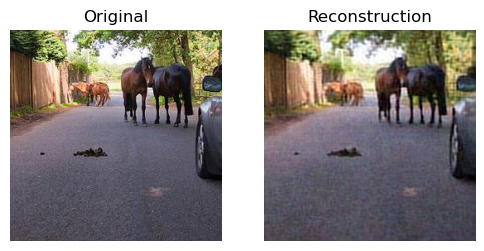

Training:  19%|███████████▊                                                   | 7500/40000 [1:20:16<5:48:49,  1.55it/s]


[Step 7500] Loss: 2.6381 | 
MSE: 0.003937 | Reconstruction MSE: 0.003923 | PSNR: 24.063692 | Vision MSE: 0.137390 | 
BPP: 0.622426 | Ry1: 0.388835 | Ry2: 0.197007 | Ry: 0.585842 | Rz: 0.036584 | 
Total Bits: 40791.3359 | Base Bits: 25482.7070 | Enhacement Bits: 12911.0498 | Side Information Bits: 2397.5796
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.8322 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0013 | std: 1.1261 | range: -20.2815 - 22.8298
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0011 | std: 1.1628 | range: -19.8169 - 22.5691
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0135 | std: 1.2509 | range: -19.8169 - 22.5691
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0237 | std: 0.9620 | range: -12.9334 - 11.8989
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2429 | std: 0.8646 | range: -

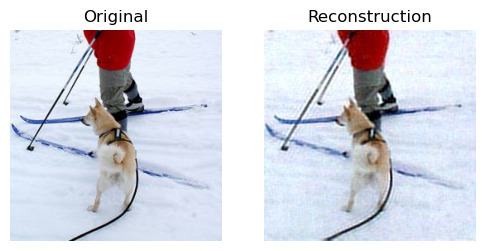

Training:  20%|████████████▌                                                  | 8000/40000 [1:25:39<5:43:42,  1.55it/s]


[Step 8000] Loss: 1.9767 | 
MSE: 0.002784 | Reconstruction MSE: 0.002771 | PSNR: 25.573997 | Vision MSE: 0.132175 | 
BPP: 0.551338 | Ry1: 0.343448 | Ry2: 0.175729 | Ry: 0.519176 | Rz: 0.032162 | 
Total Bits: 36132.5078 | Base Bits: 22508.1758 | Enhacement Bits: 11516.5469 | Side Information Bits: 2107.7820
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -13.5445 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -11.4370 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0011 | std: 0.9202 | range: -16.3933 - 17.4459
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0011 | std: 0.9651 | range: -16.6670 - 16.9519
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0136 | std: 1.0112 | range: -16.6670 - 16.9519
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0239 | std: 0.8649 | range: -12.2831 - 12.6826
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2516 | std: 0.8983 | range: -

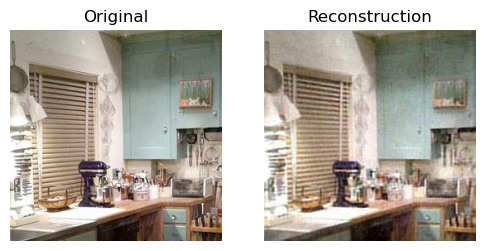

Training:  21%|█████████████▍                                                 | 8500/40000 [1:31:01<5:38:19,  1.55it/s]


[Step 8500] Loss: 1.9980 | 
MSE: 0.002788 | Reconstruction MSE: 0.002775 | PSNR: 25.568010 | Vision MSE: 0.131747 | 
BPP: 0.570644 | Ry1: 0.358574 | Ry2: 0.183270 | Ry: 0.541844 | Rz: 0.028800 | 
Total Bits: 37397.7031 | Base Bits: 23499.5176 | Enhacement Bits: 12010.7598 | Side Information Bits: 1887.4268
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -16.6355 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.7961 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0052 | std: 1.0845 | range: -25.2097 - 22.9512
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0045 | std: 1.1211 | range: -24.9308 - 23.3794
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0132 | std: 1.2101 | range: -24.9308 - 23.3794
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0128 | std: 0.9173 | range: -13.5022 - 12.5160
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2524 | std: 0.9026 | range: -

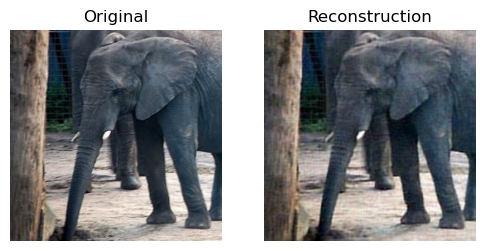

Training:  22%|██████████████▏                                                | 9000/40000 [1:36:23<5:33:15,  1.55it/s]


[Step 9000] Loss: 2.4918 | 
MSE: 0.003650 | Reconstruction MSE: 0.003637 | PSNR: 24.393023 | Vision MSE: 0.137080 | 
BPP: 0.622791 | Ry1: 0.395924 | Ry2: 0.201115 | Ry: 0.597039 | Rz: 0.025752 | 
Total Bits: 40815.2305 | Base Bits: 25947.2812 | Enhacement Bits: 13180.2969 | Side Information Bits: 1687.6545
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.2492 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0113 | std: 1.1683 | range: -22.5665 - 22.3713
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0118 | std: 1.2037 | range: -22.5006 - 22.4689
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0333 | std: 1.2942 | range: -22.5006 - 22.4689
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0313 | std: 0.9971 | range: -15.9825 - 14.5124
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2490 | std: 0.8938 | range: -

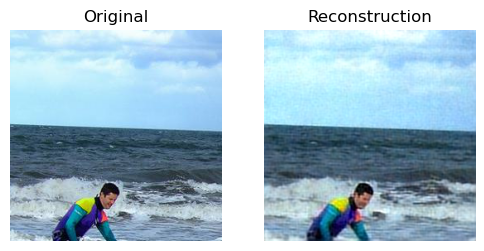

Training:  24%|██████████████▉                                                | 9500/40000 [1:41:45<5:27:35,  1.55it/s]


[Step 9500] Loss: 1.3300 | 
MSE: 0.001627 | Reconstruction MSE: 0.001615 | PSNR: 27.918890 | Vision MSE: 0.122484 | 
BPP: 0.496944 | Ry1: 0.315377 | Ry2: 0.157298 | Ry: 0.472675 | Rz: 0.024269 | 
Total Bits: 32567.7422 | Base Bits: 20668.5547 | Enhacement Bits: 10308.6855 | Side Information Bits: 1590.5013
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -16.6355 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0023 | std: 1.0004 | range: -21.9098 - 23.4742
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0024 | std: 1.0412 | range: -21.6917 - 23.0481
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0111 | std: 1.1342 | range: -21.6917 - 23.0481
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0149 | std: 0.8240 | range: -13.1896 - 12.7465
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2499 | std: 0.9058 | range: -

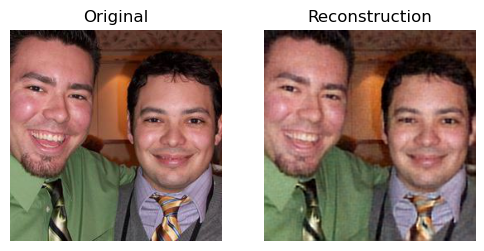

Training:  25%|███████████████▌                                              | 10000/40000 [1:47:07<5:22:07,  1.55it/s]


[Step 10000] Loss: 1.5316 | 
MSE: 0.001924 | Reconstruction MSE: 0.001910 | PSNR: 27.188835 | Vision MSE: 0.133592 | 
BPP: 0.546630 | Ry1: 0.348311 | Ry2: 0.177122 | Ry: 0.525434 | Rz: 0.021197 | 
Total Bits: 35823.9688 | Base Bits: 22826.9336 | Enhacement Bits: 11607.8945 | Side Information Bits: 1389.1451
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -12.2107 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.3870 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0052 | std: 0.9299 | range: -21.0852 - 20.1553
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0056 | std: 0.9736 | range: -21.3230 - 20.1509
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0065 | std: 1.0425 | range: -21.3230 - 20.1509
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0038 | std: 0.8187 | range: -12.0967 - 12.4362
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2402 | std: 0.9071 | range: -11

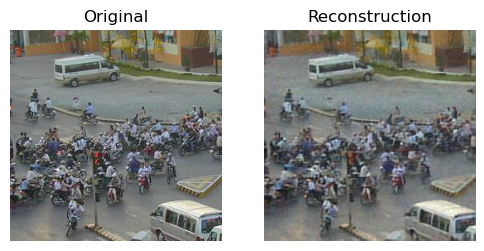

Training:  26%|████████████████▎                                             | 10500/40000 [1:52:29<5:17:20,  1.55it/s]


[Step 10500] Loss: 1.4358 | 
MSE: 0.001764 | Reconstruction MSE: 0.001751 | PSNR: 27.566437 | Vision MSE: 0.123831 | 
BPP: 0.532761 | Ry1: 0.339232 | Ry2: 0.173462 | Ry: 0.512694 | Rz: 0.020067 | 
Total Bits: 34915.0312 | Base Bits: 22231.9023 | Enhacement Bits: 11368.0029 | Side Information Bits: 1315.1270
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0085 | std: 1.1429 | range: -21.6248 - 26.0228
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0081 | std: 1.1789 | range: -21.5975 - 26.4787
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0241 | std: 1.2846 | range: -21.5975 - 26.4787
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0241 | std: 0.9313 | range: -17.3036 - 12.8015
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2612 | std: 0.9301 | range: 

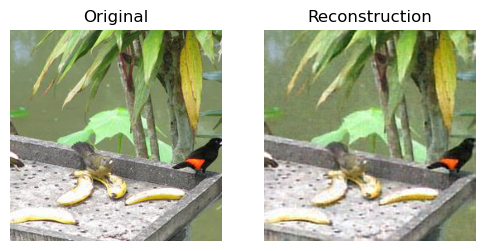

Training:  28%|█████████████████                                             | 11000/40000 [1:57:51<5:12:16,  1.55it/s]


[Step 11000] Loss: 1.6301 | 
MSE: 0.002155 | Reconstruction MSE: 0.002142 | PSNR: 26.692411 | Vision MSE: 0.132212 | 
BPP: 0.526749 | Ry1: 0.337176 | Ry2: 0.171192 | Ry: 0.508367 | Rz: 0.018382 | 
Total Bits: 34521.0234 | Base Bits: 22097.1426 | Enhacement Bits: 11219.2275 | Side Information Bits: 1204.6527
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -13.6911 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0070 | std: 0.9636 | range: -22.8559 - 21.4064
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0062 | std: 1.0055 | range: -22.8920 - 20.9148
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0142 | std: 1.1015 | range: -22.8920 - 20.9148
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0097 | std: 0.7786 | range: -9.0986 - 12.9808
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2430 | std: 0.9110 | range: -12

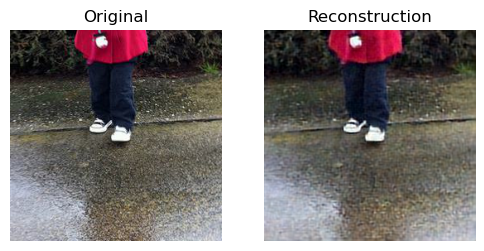

Training:  29%|█████████████████▊                                            | 11500/40000 [2:03:13<5:06:35,  1.55it/s]


[Step 11500] Loss: 1.8229 | 
MSE: 0.002458 | Reconstruction MSE: 0.002444 | PSNR: 26.118816 | Vision MSE: 0.138041 | 
BPP: 0.564455 | Ry1: 0.360449 | Ry2: 0.186478 | Ry: 0.546927 | Rz: 0.017529 | 
Total Bits: 36992.1484 | Base Bits: 23622.3984 | Enhacement Bits: 12220.9961 | Side Information Bits: 1148.7551
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -17.3287 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0113 | std: 1.0236 | range: -25.4104 - 21.8157
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0117 | std: 1.0640 | range: -25.8926 - 22.3002
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0210 | std: 1.1450 | range: -25.8926 - 22.3002
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0068 | std: 0.8795 | range: -13.1674 - 13.9786
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2278 | std: 0.8924 | range: 

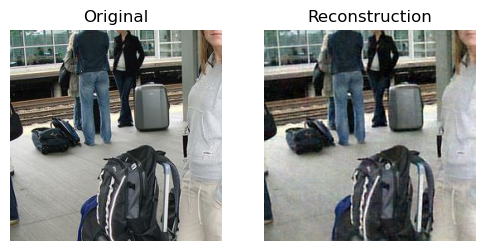

Training:  30%|██████████████████▌                                           | 12000/40000 [2:08:36<5:02:07,  1.54it/s]


[Step 12000] Loss: 0.8538 | 
MSE: 0.000852 | Reconstruction MSE: 0.000842 | PSNR: 30.746744 | Vision MSE: 0.103245 | 
BPP: 0.417370 | Ry1: 0.268817 | Ry2: 0.131877 | Ry: 0.400693 | Rz: 0.016676 | 
Total Bits: 27352.7285 | Base Bits: 17617.1641 | Enhacement Bits: 8642.6680 | Side Information Bits: 1092.8965
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.0261 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0074 | std: 1.0667 | range: -23.6714 - 22.9431
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0078 | std: 1.1054 | range: -23.4079 - 22.9818
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0143 | std: 1.2459 | range: -23.4079 - 22.9818
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0052 | std: 0.7492 | range: -12.0074 - 13.0853
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2658 | std: 0.9100 | range: -

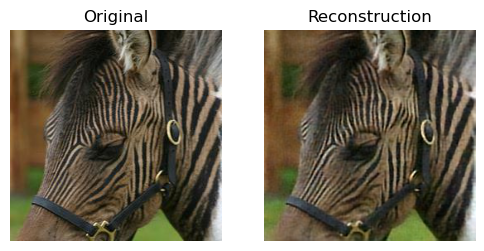

Training:  31%|███████████████████▍                                          | 12500/40000 [2:13:58<4:56:06,  1.55it/s]


[Step 12500] Loss: 1.8937 | 
MSE: 0.002532 | Reconstruction MSE: 0.002519 | PSNR: 25.988232 | Vision MSE: 0.137636 | 
BPP: 0.597066 | Ry1: 0.385303 | Ry2: 0.196016 | Ry: 0.581320 | Rz: 0.015746 | 
Total Bits: 39129.3203 | Base Bits: 25251.2422 | Enhacement Bits: 12846.1240 | Side Information Bits: 1031.9512
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.5369 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0032 | std: 1.1454 | range: -22.4996 - 23.6140
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0033 | std: 1.1805 | range: -22.7644 - 24.0160
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0075 | std: 1.2907 | range: -22.7644 - 24.0160
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0050 | std: 0.9212 | range: -12.4751 - 14.0359
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2533 | std: 0.9416 | range: 

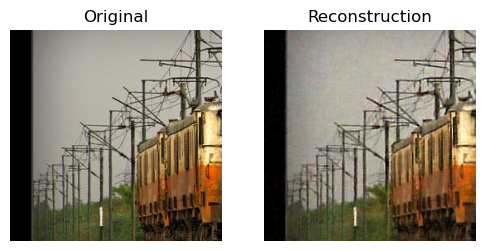

Training:  32%|████████████████████▏                                         | 13000/40000 [2:19:21<4:50:12,  1.55it/s]


[Step 13000] Loss: 2.2706 | 
MSE: 0.003204 | Reconstruction MSE: 0.003190 | PSNR: 24.962490 | Vision MSE: 0.140904 | 
BPP: 0.630224 | Ry1: 0.406219 | Ry2: 0.209629 | Ry: 0.615847 | Rz: 0.014376 | 
Total Bits: 41302.3359 | Base Bits: 26621.9492 | Enhacement Bits: 13738.2246 | Side Information Bits: 942.1649
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.9424 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.1582 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0028 | std: 1.0813 | range: -18.6987 - 31.2377
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0029 | std: 1.1185 | range: -19.0099 - 31.0508
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0049 | std: 1.2180 | range: -19.0099 - 31.0508
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0012 | std: 0.8867 | range: -12.3519 - 11.4021
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2410 | std: 0.9311 | range: -

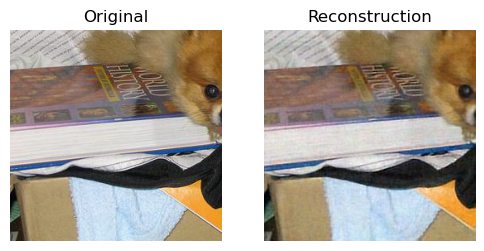

Training:  34%|████████████████████▉                                         | 13500/40000 [2:24:43<4:45:10,  1.55it/s]


[Step 13500] Loss: 1.2215 | 
MSE: 0.001355 | Reconstruction MSE: 0.001343 | PSNR: 28.719826 | Vision MSE: 0.121859 | 
BPP: 0.527714 | Ry1: 0.338970 | Ry2: 0.174772 | Ry: 0.513742 | Rz: 0.013972 | 
Total Bits: 34584.2695 | Base Bits: 22214.7207 | Enhacement Bits: 11453.8652 | Side Information Bits: 915.6839
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -16.2301 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0033 | std: 1.0951 | range: -22.1620 - 26.5686
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0029 | std: 1.1318 | range: -22.5683 - 26.4118
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0083 | std: 1.2644 | range: -22.5683 - 26.4118
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0079 | std: 0.8036 | range: -13.1878 - 11.4884
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2544 | std: 0.9413 | range: -13

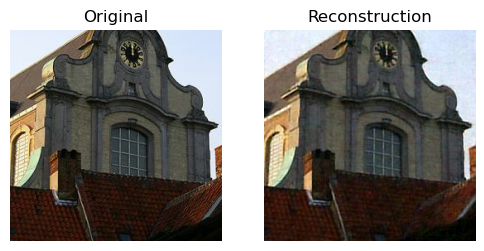

Training:  35%|█████████████████████▋                                        | 14000/40000 [2:30:05<4:38:55,  1.55it/s]


[Step 14000] Loss: 1.8320 | 
MSE: 0.002485 | Reconstruction MSE: 0.002472 | PSNR: 26.068939 | Vision MSE: 0.122734 | 
BPP: 0.559857 | Ry1: 0.357534 | Ry2: 0.191089 | Ry: 0.548622 | Rz: 0.011234 | 
Total Bits: 36690.7656 | Base Bits: 23431.3379 | Enhacement Bits: 12523.1816 | Side Information Bits: 736.2453
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -17.3287 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0117 | std: 0.7382 | range: -15.9514 - 16.9866
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0122 | std: 0.7926 | range: -16.2080 - 17.1013
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0150 | std: 0.8241 | range: -16.2080 - 17.1013
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0066 | std: 0.7256 | range: -11.0209 - 12.3454
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2416 | std: 0.9439 | range: 

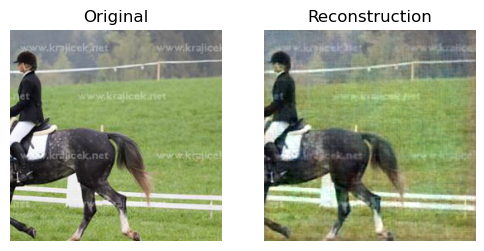

Training:  36%|██████████████████████▍                                       | 14500/40000 [2:35:28<4:10:35,  1.70it/s]


[Step 14500] Loss: 4.1801 | 
MSE: 0.006403 | Reconstruction MSE: 0.006387 | PSNR: 21.947239 | Vision MSE: 0.164706 | 
BPP: 0.901657 | Ry1: 0.587695 | Ry2: 0.300841 | Ry: 0.888536 | Rz: 0.013121 | 
Total Bits: 59090.9766 | Base Bits: 38515.1719 | Enhacement Bits: 19715.9297 | Side Information Bits: 859.8763
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (1, 128, 16, 16) | min: -12.8513 | max: 0.0000
Log_Probabilites logp_y2 | shape: (1, 64, 16, 16) | min: -10.3523 | max: 0.0000
Latent Variable y | shape: (1, 192, 16, 16) | mean: -0.0172 | std: 1.1312 | range: -11.9245 - 13.1626
Qantized Variable y_hat | shape: (1, 192, 16, 16) | mean: -0.0156 | std: 1.1684 | range: -12.1576 - 13.0452
Base Variable y1 | shape: (1, 128, 16, 16) | mean: -0.0147 | std: 1.2224 | range: -12.1576 - 13.0452
Enhacement Variable y2 | shape: (1, 64, 16, 16) | mean: -0.0173 | std: 1.0520 | range: -9.1293 - 8.8471
Feature Variable F | shape: (1, 256, 32, 32) | mean: -0.2873 | std: 1.0987 | range: -1

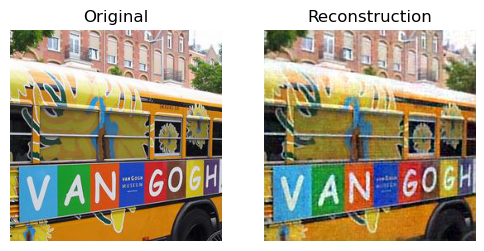

Training:  38%|███████████████████████▎                                      | 15000/40000 [2:40:51<4:29:36,  1.55it/s]


[Step 15000] Loss: 1.6807 | 
MSE: 0.002214 | Reconstruction MSE: 0.002201 | PSNR: 26.573069 | Vision MSE: 0.125081 | 
BPP: 0.547192 | Ry1: 0.351793 | Ry2: 0.183070 | Ry: 0.534863 | Rz: 0.012329 | 
Total Bits: 35860.8008 | Base Bits: 23055.1250 | Enhacement Bits: 11997.6602 | Side Information Bits: 808.0149
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -12.3942 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -16.2301 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0111 | std: 0.8472 | range: -16.3717 - 16.7776
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0105 | std: 0.8949 | range: -16.4008 - 16.6093
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0131 | std: 0.9480 | range: -16.0333 - 16.6093
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0053 | std: 0.7779 | range: -16.4008 - 14.2981
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2497 | std: 1.0109 | range: 

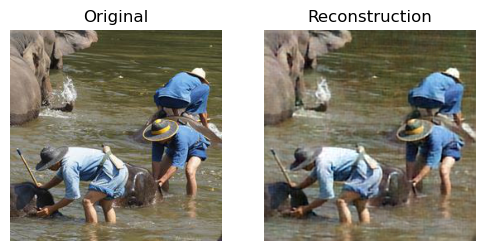

Training:  39%|████████████████████████                                      | 15500/40000 [2:46:13<4:23:16,  1.55it/s]


[Step 15500] Loss: 1.6090 | 
MSE: 0.002012 | Reconstruction MSE: 0.001999 | PSNR: 26.992685 | Vision MSE: 0.133186 | 
BPP: 0.578935 | Ry1: 0.370440 | Ry2: 0.196652 | Ry: 0.567092 | Rz: 0.011843 | 
Total Bits: 37941.0820 | Base Bits: 24277.1797 | Enhacement Bits: 12887.7910 | Side Information Bits: 776.1116
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -16.6355 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -14.5561 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0228 | std: 0.9291 | range: -18.3704 - 20.0156
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0225 | std: 0.9727 | range: -18.1182 - 20.2065
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0342 | std: 1.0293 | range: -18.1182 - 20.2065
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0009 | std: 0.8477 | range: -13.1336 - 12.6981
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2491 | std: 1.0074 | range: -

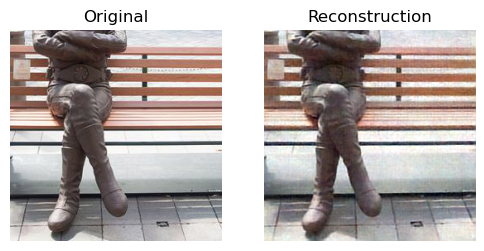

Training:  40%|████████████████████████▊                                     | 16000/40000 [2:51:35<4:18:59,  1.54it/s]


[Step 16000] Loss: 1.3706 | 
MSE: 0.001732 | Reconstruction MSE: 0.001721 | PSNR: 27.643414 | Vision MSE: 0.116468 | 
BPP: 0.483751 | Ry1: 0.309612 | Ry2: 0.161815 | Ry: 0.471427 | Rz: 0.012323 | 
Total Bits: 31703.0820 | Base Bits: 20290.7617 | Enhacement Bits: 10604.6973 | Side Information Bits: 807.6205
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -16.6355 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.9424 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0157 | std: 0.8707 | range: -20.8615 - 21.6734
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0159 | std: 0.9170 | range: -20.8554 - 21.4282
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0221 | std: 0.9841 | range: -20.8554 - 21.4282
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0036 | std: 0.7652 | range: -13.6125 - 11.2158
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2495 | std: 0.9901 | range: 

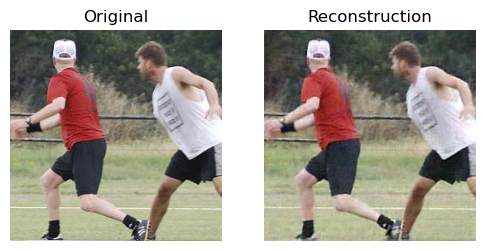

Training:  41%|█████████████████████████▌                                    | 16500/40000 [2:56:57<4:12:52,  1.55it/s]


[Step 16500] Loss: 1.3987 | 
MSE: 0.001680 | Reconstruction MSE: 0.001668 | PSNR: 27.779144 | Vision MSE: 0.126640 | 
BPP: 0.538433 | Ry1: 0.346254 | Ry2: 0.180119 | Ry: 0.526372 | Rz: 0.012060 | 
Total Bits: 35286.7383 | Base Bits: 22692.0977 | Enhacement Bits: 11804.2461 | Side Information Bits: 790.3939
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.1543 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0136 | std: 0.9784 | range: -19.1213 - 22.4248
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0139 | std: 1.0196 | range: -19.2269 - 22.1699
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0173 | std: 1.1166 | range: -19.2269 - 22.1699
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0072 | std: 0.7908 | range: -11.8248 - 11.2503
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2486 | std: 0.9922 | range: 

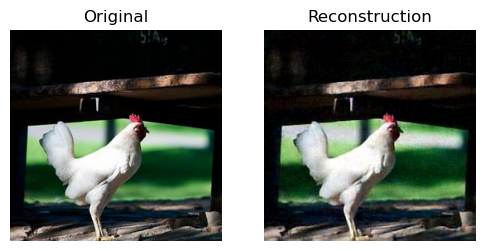

Training:  42%|██████████████████████████▎                                   | 17000/40000 [3:02:20<4:08:14,  1.54it/s]


[Step 17000] Loss: 1.6701 | 
MSE: 0.002156 | Reconstruction MSE: 0.002143 | PSNR: 26.689743 | Vision MSE: 0.133639 | 
BPP: 0.566023 | Ry1: 0.364811 | Ry2: 0.190049 | Ry: 0.554861 | Rz: 0.011162 | 
Total Bits: 37094.8906 | Base Bits: 23908.2852 | Enhacement Bits: 12455.0605 | Side Information Bits: 731.5444
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.0946 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0263 | std: 1.0051 | range: -20.6714 - 20.6969
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0262 | std: 1.0454 | range: -20.9891 - 21.1058
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0322 | std: 1.1327 | range: -20.9891 - 21.1058
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0143 | std: 0.8437 | range: -17.3160 - 12.3554
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2473 | std: 0.9875 | range: 

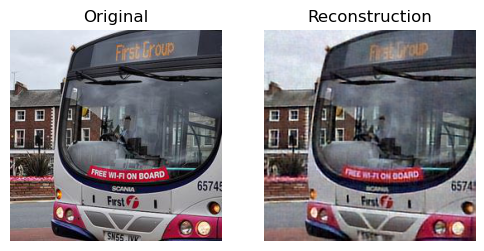

Training:  44%|███████████████████████████▏                                  | 17500/40000 [3:07:43<4:02:13,  1.55it/s]


[Step 17500] Loss: 1.1058 | 
MSE: 0.001269 | Reconstruction MSE: 0.001258 | PSNR: 29.002876 | Vision MSE: 0.106369 | 
BPP: 0.456170 | Ry1: 0.295470 | Ry2: 0.148893 | Ry: 0.444363 | Rz: 0.011807 | 
Total Bits: 29895.5234 | Base Bits: 19363.9160 | Enhacement Bits: 9757.8320 | Side Information Bits: 773.7766
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.8947 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0190 | std: 1.0045 | range: -25.9253 - 27.1521
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0191 | std: 1.0445 | range: -25.7122 - 27.3062
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0235 | std: 1.1720 | range: -25.7122 - 27.3062
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0105 | std: 0.7253 | range: -14.6796 - 11.4931
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2683 | std: 0.9939 | range: -

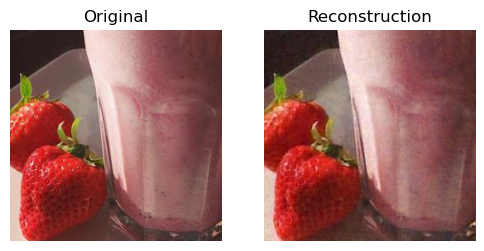

Training:  45%|███████████████████████████▉                                  | 18000/40000 [3:13:06<3:56:48,  1.55it/s]


[Step 18000] Loss: 2.0418 | 
MSE: 0.002792 | Reconstruction MSE: 0.002779 | PSNR: 25.561722 | Vision MSE: 0.135591 | 
BPP: 0.612242 | Ry1: 0.395120 | Ry2: 0.205500 | Ry: 0.600619 | Rz: 0.011623 | 
Total Bits: 40123.9141 | Base Bits: 25894.5547 | Enhacement Bits: 13467.6240 | Side Information Bits: 761.7321
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -16.2301 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0082 | std: 1.1313 | range: -23.9609 - 24.6184
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0078 | std: 1.1679 | range: -24.2774 - 24.8262
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0147 | std: 1.2603 | range: -24.2774 - 24.8262
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0060 | std: 0.9567 | range: -15.0604 - 15.5416
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2544 | std: 1.0099 | range: -

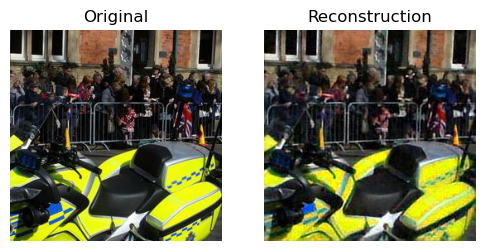

Training:  46%|████████████████████████████▋                                 | 18500/40000 [3:18:29<3:51:32,  1.55it/s]


[Step 18500] Loss: 1.3093 | 
MSE: 0.001573 | Reconstruction MSE: 0.001561 | PSNR: 28.066990 | Vision MSE: 0.122284 | 
BPP: 0.504007 | Ry1: 0.327517 | Ry2: 0.165761 | Ry: 0.493279 | Rz: 0.010728 | 
Total Bits: 33030.5781 | Base Bits: 21464.1816 | Enhacement Bits: 10863.3418 | Side Information Bits: 703.0558
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -13.3397 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.8069 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0175 | std: 1.0787 | range: -18.1877 - 20.5892
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0171 | std: 1.1166 | range: -18.5571 - 20.9776
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0235 | std: 1.2548 | range: -18.5571 - 20.9776
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0043 | std: 0.7689 | range: -14.5292 - 12.2290
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2522 | std: 0.9810 | range: 

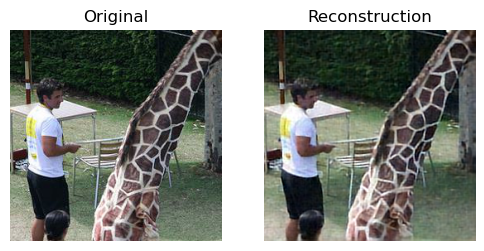

Training:  48%|█████████████████████████████▍                                | 19000/40000 [3:23:52<3:46:25,  1.55it/s]


[Step 19000] Loss: 1.2846 | 
MSE: 0.001572 | Reconstruction MSE: 0.001561 | PSNR: 28.066490 | Vision MSE: 0.112704 | 
BPP: 0.479721 | Ry1: 0.311009 | Ry2: 0.158165 | Ry: 0.469174 | Rz: 0.010547 | 
Total Bits: 31439.0039 | Base Bits: 20382.2773 | Enhacement Bits: 10365.5127 | Side Information Bits: 691.2140
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.2511 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0159 | std: 0.9750 | range: -22.7747 - 22.0643
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0160 | std: 1.0173 | range: -22.4382 - 21.6812
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0198 | std: 1.1246 | range: -22.4382 - 21.6812
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0084 | std: 0.7582 | range: -14.5960 - 14.9756
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2633 | std: 0.9760 | range: 

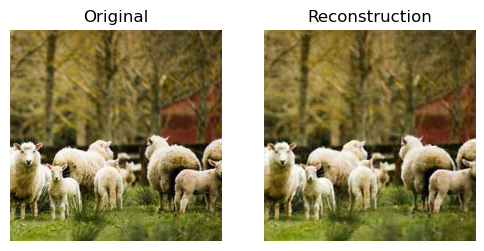

Training:  49%|██████████████████████████████▏                               | 19500/40000 [3:29:15<3:40:47,  1.55it/s]


[Step 19500] Loss: 1.3304 | 
MSE: 0.001609 | Reconstruction MSE: 0.001596 | PSNR: 27.968822 | Vision MSE: 0.124379 | 
BPP: 0.506766 | Ry1: 0.329207 | Ry2: 0.167083 | Ry: 0.496290 | Rz: 0.010475 | 
Total Bits: 33211.4062 | Base Bits: 21574.9258 | Enhacement Bits: 10949.9580 | Side Information Bits: 686.5217
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -13.5910 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.2492 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0262 | std: 1.1482 | range: -20.6632 - 27.8683
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0258 | std: 1.1843 | range: -20.5705 - 28.3567
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0355 | std: 1.3276 | range: -20.5705 - 28.3567
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0062 | std: 0.8257 | range: -14.1891 - 18.1123
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2484 | std: 0.9561 | range: 

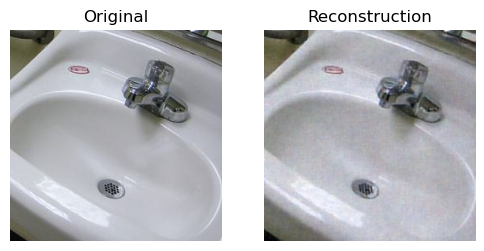

Training:  50%|███████████████████████████████                               | 20000/40000 [3:34:38<3:35:57,  1.54it/s]


[Step 20000] Loss: 1.5319 | 
MSE: 0.001945 | Reconstruction MSE: 0.001932 | PSNR: 27.139151 | Vision MSE: 0.125401 | 
BPP: 0.536113 | Ry1: 0.346633 | Ry2: 0.179135 | Ry: 0.525768 | Rz: 0.010345 | 
Total Bits: 35134.6875 | Base Bits: 22716.9492 | Enhacement Bits: 11739.7617 | Side Information Bits: 677.9801
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -12.6465 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -10.4903 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0077 | std: 0.9414 | range: -23.9904 - 23.2454
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0071 | std: 0.9842 | range: -24.3909 - 23.2947
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0103 | std: 1.0653 | range: -24.3909 - 23.2947
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0007 | std: 0.7977 | range: -14.5544 - 13.5988
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2552 | std: 0.9711 | range: 

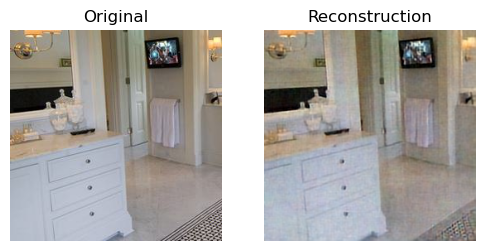

Training:  51%|███████████████████████████████▊                              | 20500/40000 [3:40:01<3:29:50,  1.55it/s]


[Step 20500] Loss: 1.5766 | 
MSE: 0.001988 | Reconstruction MSE: 0.001975 | PSNR: 27.045078 | Vision MSE: 0.130022 | 
BPP: 0.558936 | Ry1: 0.361063 | Ry2: 0.187190 | Ry: 0.548253 | Rz: 0.010683 | 
Total Bits: 36630.4141 | Base Bits: 23662.6406 | Enhacement Bits: 12267.6797 | Side Information Bits: 700.0956
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -16.6355 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.9424 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0153 | std: 1.1456 | range: -26.1633 - 22.6148
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0153 | std: 1.1813 | range: -26.1232 - 22.9023
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0304 | std: 1.2928 | range: -26.1232 - 22.9023
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0148 | std: 0.9177 | range: -14.3931 - 14.8491
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2563 | std: 0.9866 | range: -

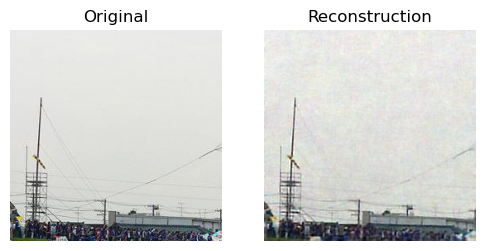

Training:  52%|████████████████████████████████▌                             | 21000/40000 [3:45:23<3:24:15,  1.55it/s]


[Step 21000] Loss: 1.1596 | 
MSE: 0.001351 | Reconstruction MSE: 0.001340 | PSNR: 28.729950 | Vision MSE: 0.114251 | 
BPP: 0.467798 | Ry1: 0.302801 | Ry2: 0.154634 | Ry: 0.457435 | Rz: 0.010363 | 
Total Bits: 30657.6094 | Base Bits: 19844.3477 | Enhacement Bits: 10134.0977 | Side Information Bits: 679.1635
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -14.1098 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.2349 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0182 | std: 1.0256 | range: -20.3348 - 23.6848
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0181 | std: 1.0657 | range: -20.3064 - 23.3508
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0310 | std: 1.1848 | range: -20.3064 - 23.3508
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0077 | std: 0.7736 | range: -13.9977 - 14.1735
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2577 | std: 0.9738 | range: -

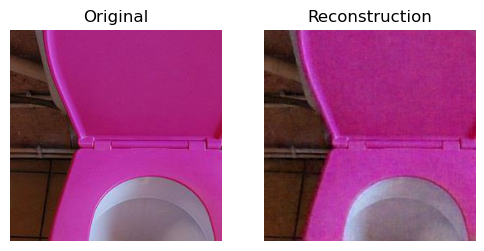

Training:  54%|█████████████████████████████████▎                            | 21500/40000 [3:50:46<3:19:37,  1.54it/s]


[Step 21500] Loss: 1.3613 | 
MSE: 0.001755 | Reconstruction MSE: 0.001743 | PSNR: 27.586069 | Vision MSE: 0.114667 | 
BPP: 0.462794 | Ry1: 0.300017 | Ry2: 0.152356 | Ry: 0.452373 | Rz: 0.010421 | 
Total Bits: 30329.6523 | Base Bits: 19661.9258 | Enhacement Bits: 9984.7881 | Side Information Bits: 682.9376
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0123 | std: 1.0835 | range: -22.4135 - 22.5016
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0126 | std: 1.1215 | range: -22.4069 - 22.7323
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0205 | std: 1.2646 | range: -22.4069 - 22.7323
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0032 | std: 0.7581 | range: -15.6828 - 13.4086
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2569 | std: 0.9598 | range: -1

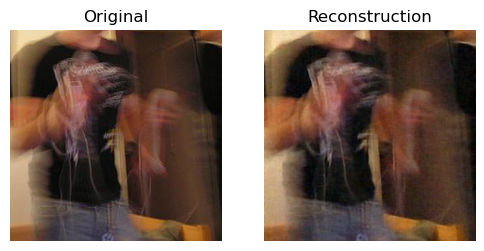

Training:  55%|██████████████████████████████████                            | 22000/40000 [3:56:10<3:14:18,  1.54it/s]


[Step 22000] Loss: 1.4036 | 
MSE: 0.001668 | Reconstruction MSE: 0.001656 | PSNR: 27.808941 | Vision MSE: 0.122079 | 
BPP: 0.549353 | Ry1: 0.358707 | Ry2: 0.179649 | Ry: 0.538356 | Rz: 0.010997 | 
Total Bits: 36002.4062 | Base Bits: 23508.2305 | Enhacement Bits: 11773.4990 | Side Information Bits: 720.6766
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.0817 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0024 | std: 1.0554 | range: -22.4754 - 22.2788
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0022 | std: 1.0944 | range: -22.7204 - 21.9492
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0097 | std: 1.1946 | range: -22.7204 - 21.9492
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0129 | std: 0.8596 | range: -14.5647 - 13.2669
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2590 | std: 0.9792 | range: -14

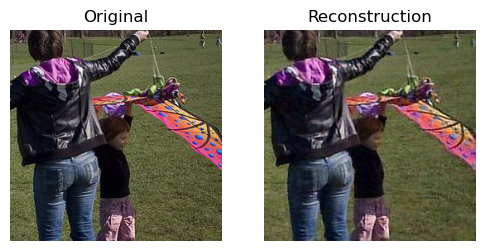

Training:  56%|██████████████████████████████████▉                           | 22500/40000 [4:01:34<3:08:53,  1.54it/s]


[Step 22500] Loss: 1.9796 | 
MSE: 0.002714 | Reconstruction MSE: 0.002701 | PSNR: 25.684183 | Vision MSE: 0.130406 | 
BPP: 0.589824 | Ry1: 0.382853 | Ry2: 0.196344 | Ry: 0.579197 | Rz: 0.010627 | 
Total Bits: 38654.6836 | Base Bits: 25090.6270 | Enhacement Bits: 12867.6074 | Side Information Bits: 696.4497
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -14.4383 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -14.6206 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0271 | std: 1.2213 | range: -21.2139 - 24.6604
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0260 | std: 1.2550 | range: -20.8200 - 24.9638
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0372 | std: 1.4099 | range: -20.8200 - 24.9638
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0037 | std: 0.8654 | range: -14.7605 - 12.9664
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2561 | std: 0.9823 | range: 

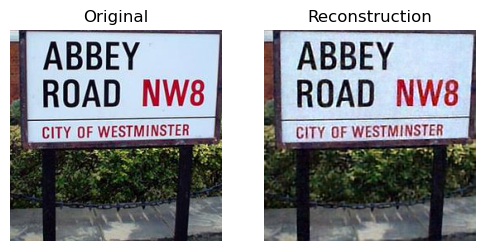

Training:  57%|███████████████████████████████████▋                          | 23000/40000 [4:06:57<3:03:15,  1.55it/s]


[Step 23000] Loss: 1.4007 | 
MSE: 0.001752 | Reconstruction MSE: 0.001741 | PSNR: 27.592466 | Vision MSE: 0.114531 | 
BPP: 0.503590 | Ry1: 0.327393 | Ry2: 0.165379 | Ry: 0.492771 | Rz: 0.010819 | 
Total Bits: 33003.2969 | Base Bits: 21456.0078 | Enhacement Bits: 10838.2598 | Side Information Bits: 709.0320
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.5220 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0146 | std: 1.1616 | range: -20.9294 - 29.1185
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0150 | std: 1.1969 | range: -21.1798 - 29.3447
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0211 | std: 1.3362 | range: -21.1798 - 29.3447
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0030 | std: 0.8523 | range: -12.1440 - 15.6797
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2640 | std: 0.9732 | range: 

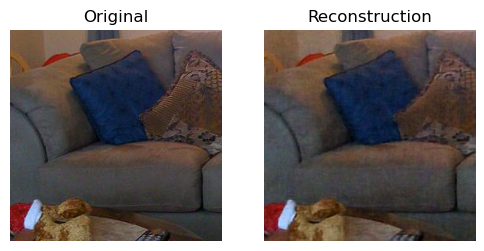

Training:  59%|████████████████████████████████████▍                         | 23500/40000 [4:12:21<2:58:15,  1.54it/s]


[Step 23500] Loss: 1.3112 | 
MSE: 0.001571 | Reconstruction MSE: 0.001560 | PSNR: 28.067865 | Vision MSE: 0.110055 | 
BPP: 0.506655 | Ry1: 0.332452 | Ry2: 0.163718 | Ry: 0.496169 | Rz: 0.010486 | 
Total Bits: 33204.1719 | Base Bits: 21787.5547 | Enhacement Bits: 10729.3906 | Side Information Bits: 687.2271
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0164 | std: 1.2976 | range: -22.3229 - 29.0017
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0160 | std: 1.3294 | range: -22.1579 - 29.2526
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0249 | std: 1.5191 | range: -22.1579 - 29.2526
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0018 | std: 0.8282 | range: -15.1001 - 16.1500
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2651 | std: 0.9965 | range: -

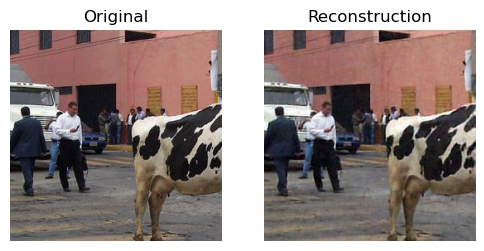

Training:  60%|█████████████████████████████████████▏                        | 24000/40000 [4:17:44<2:53:05,  1.54it/s]


[Step 24000] Loss: 1.5708 | 
MSE: 0.001952 | Reconstruction MSE: 0.001939 | PSNR: 27.123259 | Vision MSE: 0.123550 | 
BPP: 0.571530 | Ry1: 0.372567 | Ry2: 0.188603 | Ry: 0.561170 | Rz: 0.010361 | 
Total Bits: 37455.8164 | Base Bits: 24416.5391 | Enhacement Bits: 12360.2803 | Side Information Bits: 678.9983
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -11.0710 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0032 | std: 1.2202 | range: -23.0810 - 32.1314
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0033 | std: 1.2536 | range: -23.2869 - 32.4930
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0048 | std: 1.4154 | range: -23.2869 - 32.4930
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0003 | std: 0.8413 | range: -14.2998 - 12.9846
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2668 | std: 0.9981 | range: -14.

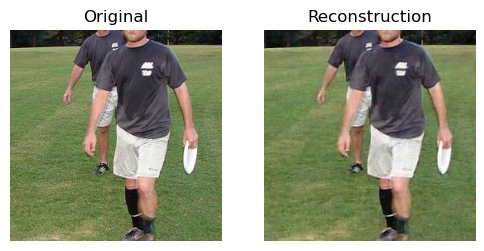

Training:  61%|█████████████████████████████████████▉                        | 24500/40000 [4:23:08<2:47:35,  1.54it/s]


[Step 24500] Loss: 1.3334 | 
MSE: 0.001541 | Reconstruction MSE: 0.001529 | PSNR: 28.157236 | Vision MSE: 0.122524 | 
BPP: 0.544485 | Ry1: 0.352081 | Ry2: 0.182231 | Ry: 0.534313 | Rz: 0.010173 | 
Total Bits: 35683.3867 | Base Bits: 23074.0117 | Enhacement Bits: 11942.6943 | Side Information Bits: 666.6803
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.7192 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0062 | std: 1.1176 | range: -27.3985 - 21.2397
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0066 | std: 1.1547 | range: -27.8839 - 21.5480
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0120 | std: 1.2944 | range: -27.8839 - 21.5480
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0043 | std: 0.8054 | range: -15.9346 - 11.6476
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2535 | std: 0.9999 | range: -14

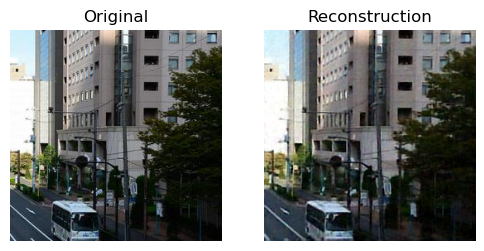

Training:  62%|██████████████████████████████████████▊                       | 25000/40000 [4:28:32<2:42:32,  1.54it/s]


[Step 25000] Loss: 1.2852 | 
MSE: 0.001530 | Reconstruction MSE: 0.001518 | PSNR: 28.187122 | Vision MSE: 0.116324 | 
BPP: 0.502032 | Ry1: 0.326890 | Ry2: 0.164031 | Ry: 0.490921 | Rz: 0.011111 | 
Total Bits: 32901.1562 | Base Bits: 21423.0664 | Enhacement Bits: 10749.9326 | Side Information Bits: 728.1572
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.6652 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0078 | std: 1.1917 | range: -26.3642 - 33.6341
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0074 | std: 1.2258 | range: -26.5130 - 33.6187
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0090 | std: 1.3920 | range: -26.5130 - 33.6187
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0041 | std: 0.7954 | range: -16.4699 - 12.8257
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2649 | std: 0.9952 | range: 

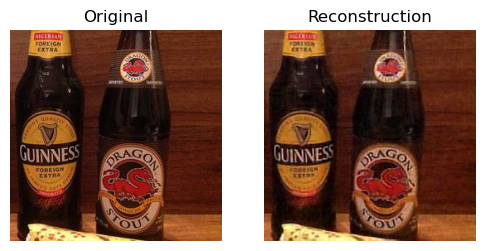

Training:  64%|███████████████████████████████████████▌                      | 25500/40000 [4:33:56<2:36:24,  1.55it/s]


[Step 25500] Loss: 1.4864 | 
MSE: 0.001924 | Reconstruction MSE: 0.001912 | PSNR: 27.185146 | Vision MSE: 0.120666 | 
BPP: 0.501292 | Ry1: 0.327127 | Ry2: 0.163378 | Ry: 0.490505 | Rz: 0.010787 | 
Total Bits: 32852.6797 | Base Bits: 21438.6055 | Enhacement Bits: 10707.1348 | Side Information Bits: 706.9406
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.5580 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0172 | std: 1.2174 | range: -26.9628 - 25.0258
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0165 | std: 1.2513 | range: -26.4872 - 25.3355
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0232 | std: 1.4340 | range: -26.4872 - 25.3355
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0030 | std: 0.7643 | range: -17.2956 - 16.5548
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2465 | std: 0.9262 | range: 

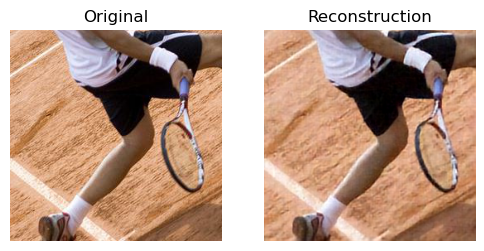

Training:  65%|████████████████████████████████████████▎                     | 26000/40000 [4:39:20<2:30:40,  1.55it/s]


[Step 26000] Loss: 1.5298 | 
MSE: 0.001941 | Reconstruction MSE: 0.001930 | PSNR: 27.145388 | Vision MSE: 0.117034 | 
BPP: 0.535903 | Ry1: 0.352827 | Ry2: 0.172446 | Ry: 0.525273 | Rz: 0.010631 | 
Total Bits: 35120.9648 | Base Bits: 23122.8633 | Enhacement Bits: 11301.4004 | Side Information Bits: 696.7018
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0327 | std: 1.2498 | range: -20.9002 - 21.5218
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0331 | std: 1.2822 | range: -20.6036 - 22.0188
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0488 | std: 1.4469 | range: -20.6036 - 22.0188
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0017 | std: 0.8627 | range: -16.8590 - 14.1452
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2698 | std: 0.9911 | range: 

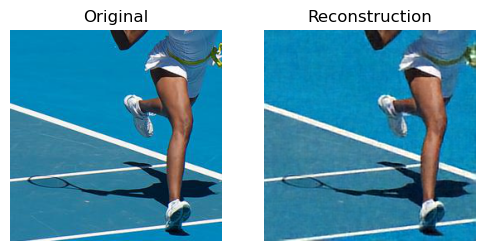

Training:  66%|█████████████████████████████████████████                     | 26500/40000 [4:44:43<2:25:40,  1.54it/s]


[Step 26500] Loss: 1.8259 | 
MSE: 0.002446 | Reconstruction MSE: 0.002433 | PSNR: 26.138792 | Vision MSE: 0.128249 | 
BPP: 0.573702 | Ry1: 0.374171 | Ry2: 0.189183 | Ry: 0.563354 | Rz: 0.010348 | 
Total Bits: 37598.1328 | Base Bits: 24521.7031 | Enhacement Bits: 12398.2949 | Side Information Bits: 678.1370
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -16.6355 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -14.2376 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0273 | std: 1.2868 | range: -23.0199 - 28.2704
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0276 | std: 1.3187 | range: -23.2808 - 28.3250
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0394 | std: 1.4853 | range: -23.2808 - 28.3250
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0039 | std: 0.8965 | range: -18.0609 - 15.4698
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2558 | std: 0.9731 | range: 

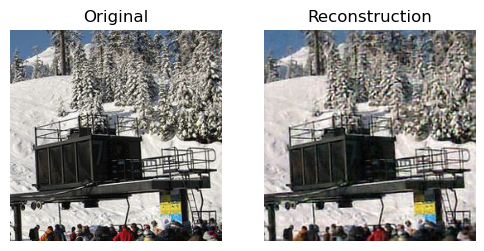

Training:  68%|█████████████████████████████████████████▊                    | 27000/40000 [4:50:06<2:20:41,  1.54it/s]


[Step 27000] Loss: 1.0155 | 
MSE: 0.001134 | Reconstruction MSE: 0.001123 | PSNR: 29.496986 | Vision MSE: 0.109064 | 
BPP: 0.435054 | Ry1: 0.283292 | Ry2: 0.141031 | Ry: 0.424324 | Rz: 0.010730 | 
Total Bits: 28511.6758 | Base Bits: 18565.8496 | Enhacement Bits: 9242.6191 | Side Information Bits: 703.2075
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.3033 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0014 | std: 1.1585 | range: -21.1665 - 28.5296
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0017 | std: 1.1928 | range: -20.9498 - 28.4199
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0017 | std: 1.3812 | range: -20.9498 - 28.4199
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0016 | std: 0.6732 | range: -11.0634 - 15.0147
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2510 | std: 0.9490 | range: -

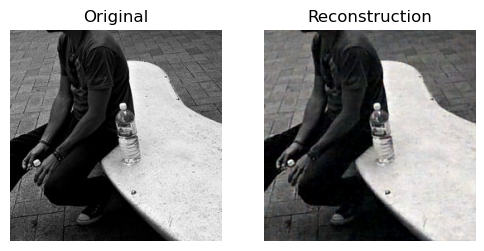

Training:  69%|██████████████████████████████████████████▋                   | 27500/40000 [4:55:30<2:14:35,  1.55it/s]


[Step 27500] Loss: 1.1082 | 
MSE: 0.001257 | Reconstruction MSE: 0.001246 | PSNR: 29.045361 | Vision MSE: 0.111592 | 
BPP: 0.464641 | Ry1: 0.302874 | Ry2: 0.151142 | Ry: 0.454016 | Rz: 0.010625 | 
Total Bits: 30450.6992 | Base Bits: 19849.1445 | Enhacement Bits: 9905.2305 | Side Information Bits: 696.3240
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.2492 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0197 | std: 1.2173 | range: -27.0912 - 28.6472
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0199 | std: 1.2518 | range: -27.0866 - 29.0006
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0299 | std: 1.4381 | range: -27.0866 - 29.0006
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0001 | std: 0.7508 | range: -14.6087 - 15.0642
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2531 | std: 0.9286 | range: -1

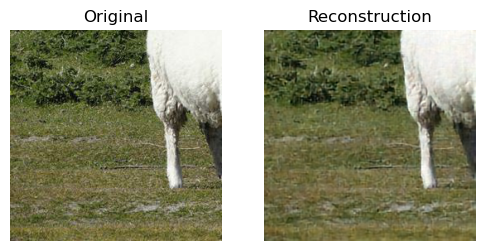

Training:  70%|███████████████████████████████████████████▍                  | 28000/40000 [5:00:53<2:09:25,  1.55it/s]


[Step 28000] Loss: 1.2080 | 
MSE: 0.001352 | Reconstruction MSE: 0.001340 | PSNR: 28.730345 | Vision MSE: 0.125042 | 
BPP: 0.515715 | Ry1: 0.336573 | Ry2: 0.168579 | Ry: 0.505152 | Rz: 0.010563 | 
Total Bits: 33797.8828 | Base Bits: 22057.6484 | Enhacement Bits: 11047.9609 | Side Information Bits: 692.2731
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.8629 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0059 | std: 1.1437 | range: -27.6508 - 22.7476
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0056 | std: 1.1800 | range: -27.5842 - 23.1522
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0082 | std: 1.3288 | range: -27.5842 - 23.1522
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0003 | std: 0.8034 | range: -18.3167 - 18.7475
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2458 | std: 0.9429 | range: 

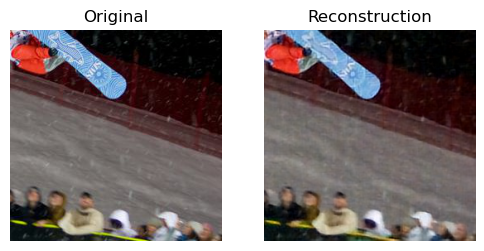

Training:  71%|████████████████████████████████████████████▏                 | 28500/40000 [5:06:17<2:04:03,  1.54it/s]


[Step 28500] Loss: 1.4622 | 
MSE: 0.001826 | Reconstruction MSE: 0.001813 | PSNR: 27.415264 | Vision MSE: 0.124647 | 
BPP: 0.527399 | Ry1: 0.343402 | Ry2: 0.173428 | Ry: 0.516830 | Rz: 0.010569 | 
Total Bits: 34563.6172 | Base Bits: 22505.1992 | Enhacement Bits: 11365.7617 | Side Information Bits: 692.6556
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -16.6355 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0098 | std: 1.1721 | range: -29.6856 - 26.9633
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0101 | std: 1.2064 | range: -29.6381 - 26.9880
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0152 | std: 1.3661 | range: -29.6381 - 26.9880
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0000 | std: 0.7956 | range: -16.1041 - 12.7119
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2387 | std: 0.8810 | range: -14

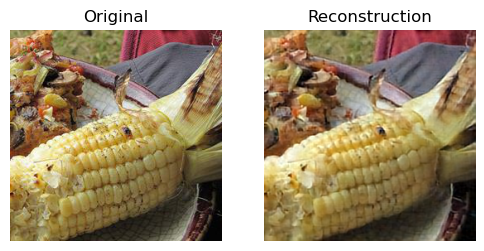

Training:  72%|████████████████████████████████████████████▉                 | 29000/40000 [5:11:41<1:48:39,  1.69it/s]


[Step 29000] Loss: 1.7744 | 
MSE: 0.002225 | Reconstruction MSE: 0.002210 | PSNR: 26.555384 | Vision MSE: 0.142878 | 
BPP: 0.635347 | Ry1: 0.411944 | Ry2: 0.212168 | Ry: 0.624112 | Rz: 0.011235 | 
Total Bits: 41638.0742 | Base Bits: 26997.1680 | Enhacement Bits: 13904.6230 | Side Information Bits: 736.2862
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (1, 128, 16, 16) | min: -17.3287 | max: 0.0000
Log_Probabilites logp_y2 | shape: (1, 64, 16, 16) | min: -9.2805 | max: 0.0000
Latent Variable y | shape: (1, 192, 16, 16) | mean: 0.0171 | std: 1.2243 | range: -15.0820 - 23.4832
Qantized Variable y_hat | shape: (1, 192, 16, 16) | mean: 0.0191 | std: 1.2589 | range: -15.1604 - 23.8729
Base Variable y1 | shape: (1, 128, 16, 16) | mean: 0.0257 | std: 1.3706 | range: -15.1604 - 23.8729
Enhacement Variable y2 | shape: (1, 64, 16, 16) | mean: 0.0060 | std: 0.9986 | range: -14.7040 - 13.3440
Feature Variable F | shape: (1, 256, 32, 32) | mean: -0.2257 | std: 0.8969 | range: -12.6

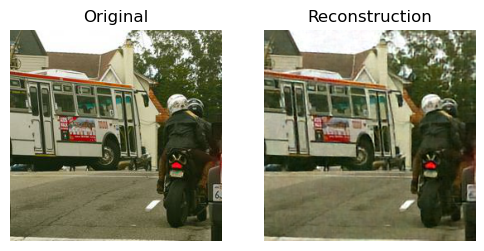

Training:  74%|█████████████████████████████████████████████▋                | 29500/40000 [5:17:05<1:53:33,  1.54it/s]


[Step 29500] Loss: 1.4957 | 
MSE: 0.001911 | Reconstruction MSE: 0.001899 | PSNR: 27.214813 | Vision MSE: 0.119740 | 
BPP: 0.517277 | Ry1: 0.339371 | Ry2: 0.166962 | Ry: 0.506333 | Rz: 0.010944 | 
Total Bits: 33900.2617 | Base Bits: 22241.0273 | Enhacement Bits: 10941.9941 | Side Information Bits: 717.2427
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -16.6355 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0057 | std: 1.2427 | range: -23.0895 - 28.8382
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0054 | std: 1.2757 | range: -23.1897 - 29.0041
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0068 | std: 1.4784 | range: -23.1897 - 29.0041
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0026 | std: 0.7149 | range: -13.9967 - 12.2223
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2461 | std: 0.8994 | range: 

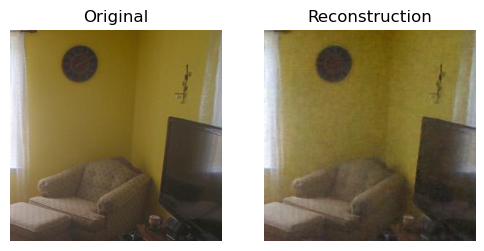

Training:  75%|██████████████████████████████████████████████▌               | 30000/40000 [5:22:29<1:47:49,  1.55it/s]


[Step 30000] Loss: 1.4498 | 
MSE: 0.001787 | Reconstruction MSE: 0.001775 | PSNR: 27.508831 | Vision MSE: 0.126361 | 
BPP: 0.534728 | Ry1: 0.351658 | Ry2: 0.172645 | Ry: 0.524303 | Rz: 0.010425 | 
Total Bits: 35043.9062 | Base Bits: 23046.2539 | Enhacement Bits: 11314.4580 | Side Information Bits: 683.1958
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.9424 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.8513 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0004 | std: 1.1834 | range: -22.7550 - 27.1239
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0000 | std: 1.2184 | range: -22.8511 - 27.1375
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0011 | std: 1.3746 | range: -22.8511 - 27.1375
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0021 | std: 0.8215 | range: -14.7217 - 15.8998
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2371 | std: 0.8906 | range: -

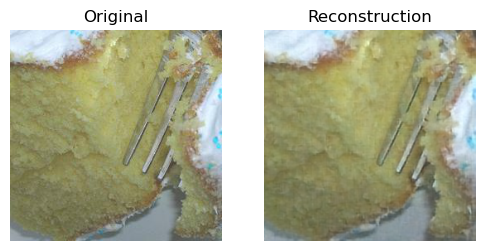

Training:  76%|███████████████████████████████████████████████▎              | 30500/40000 [5:27:53<1:42:46,  1.54it/s]


[Step 30500] Loss: 1.8738 | 
MSE: 0.002436 | Reconstruction MSE: 0.002422 | PSNR: 26.158781 | Vision MSE: 0.143481 | 
BPP: 0.626528 | Ry1: 0.412413 | Ry2: 0.203343 | Ry: 0.615756 | Rz: 0.010771 | 
Total Bits: 41060.1133 | Base Bits: 27027.9004 | Enhacement Bits: 13326.3125 | Side Information Bits: 705.8992
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -14.9308 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -11.0634 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0015 | std: 1.2923 | range: -27.2098 - 34.2158
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0017 | std: 1.3242 | range: -26.9676 - 33.9078
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0018 | std: 1.4904 | range: -26.9676 - 33.9078
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0089 | std: 0.9044 | range: -16.2858 - 18.2387
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2313 | std: 0.8972 | range: -

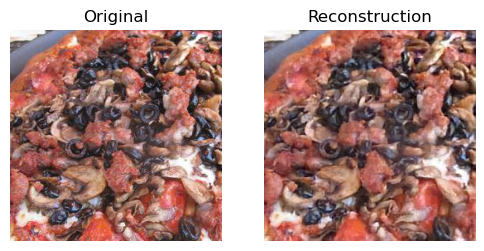

Training:  78%|████████████████████████████████████████████████              | 31000/40000 [5:33:16<1:37:18,  1.54it/s]


[Step 31000] Loss: 1.9085 | 
MSE: 0.002684 | Reconstruction MSE: 0.002672 | PSNR: 25.732418 | Vision MSE: 0.126873 | 
BPP: 0.534239 | Ry1: 0.348994 | Ry2: 0.175040 | Ry: 0.524034 | Rz: 0.010205 | 
Total Bits: 35011.9102 | Base Bits: 22871.6680 | Enhacement Bits: 11471.4277 | Side Information Bits: 668.8160
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -14.1098 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.0712 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0011 | std: 1.0737 | range: -26.2833 - 28.0939
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0013 | std: 1.1119 | range: -26.5995 - 27.8229
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0035 | std: 1.2587 | range: -26.5995 - 27.8229
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0031 | std: 0.7349 | range: -14.5728 - 11.3246
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2177 | std: 0.8629 | range: -15

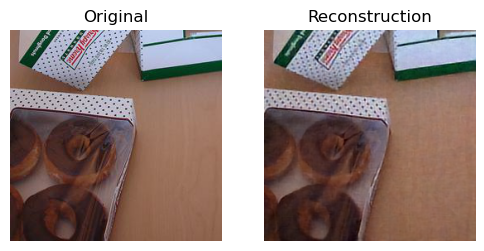

Training:  79%|████████████████████████████████████████████████▊             | 31500/40000 [5:38:40<1:31:30,  1.55it/s]


[Step 31500] Loss: 1.4392 | 
MSE: 0.001767 | Reconstruction MSE: 0.001753 | PSNR: 27.561275 | Vision MSE: 0.131583 | 
BPP: 0.534752 | Ry1: 0.351495 | Ry2: 0.172285 | Ry: 0.523780 | Rz: 0.010973 | 
Total Bits: 35045.5391 | Base Bits: 23035.5820 | Enhacement Bits: 11290.8418 | Side Information Bits: 719.1143
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.9424 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.3870 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0116 | std: 1.2360 | range: -25.6076 - 26.5957
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0113 | std: 1.2694 | range: -25.5718 - 26.5383
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0167 | std: 1.4391 | range: -25.5718 - 26.5383
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0007 | std: 0.8318 | range: -16.8851 - 16.4331
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2404 | std: 0.8995 | range: 

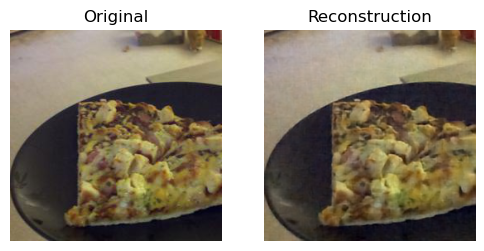

Training:  80%|█████████████████████████████████████████████████▌            | 32000/40000 [5:44:03<1:26:26,  1.54it/s]


[Step 32000] Loss: 1.2645 | 
MSE: 0.001501 | Reconstruction MSE: 0.001489 | PSNR: 28.270222 | Vision MSE: 0.121786 | 
BPP: 0.495790 | Ry1: 0.326009 | Ry2: 0.159292 | Ry: 0.485301 | Rz: 0.010490 | 
Total Bits: 32492.1270 | Base Bits: 21365.3340 | Enhacement Bits: 10439.3301 | Side Information Bits: 687.4618
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.9424 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0002 | std: 1.0897 | range: -23.4222 - 24.7175
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0002 | std: 1.1274 | range: -23.8443 - 24.7432
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0004 | std: 1.2797 | range: -23.8443 - 24.7432
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0014 | std: 0.7332 | range: -17.3059 - 15.8827
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2384 | std: 0.8846 | range: -15

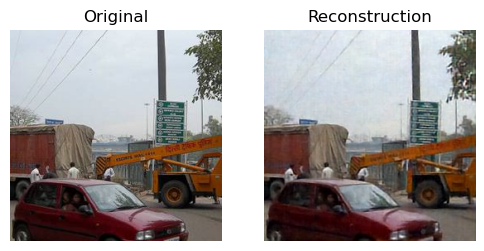

Training:  81%|██████████████████████████████████████████████████▍           | 32500/40000 [5:49:27<1:21:11,  1.54it/s]


[Step 32500] Loss: 1.0772 | 
MSE: 0.001220 | Reconstruction MSE: 0.001209 | PSNR: 29.175659 | Vision MSE: 0.113867 | 
BPP: 0.452362 | Ry1: 0.296772 | Ry2: 0.144473 | Ry: 0.441244 | Rz: 0.011118 | 
Total Bits: 29646.0234 | Base Bits: 19449.2227 | Enhacement Bits: 9468.1748 | Side Information Bits: 728.6283
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -14.5561 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0067 | std: 1.2232 | range: -26.9433 - 27.0190
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0076 | std: 1.2568 | range: -26.7489 - 27.0972
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0086 | std: 1.4401 | range: -26.7489 - 27.0972
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0056 | std: 0.7688 | range: -15.8436 - 16.8805
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2407 | std: 0.8955 | range: -

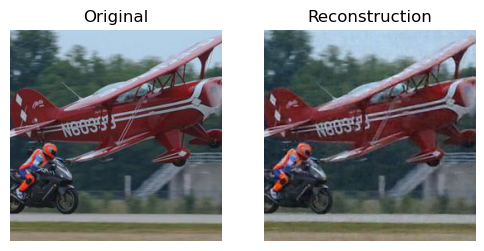

Training:  82%|███████████████████████████████████████████████████▏          | 33000/40000 [5:54:51<1:15:29,  1.55it/s]


[Step 33000] Loss: 1.2272 | 
MSE: 0.001393 | Reconstruction MSE: 0.001380 | PSNR: 28.599901 | Vision MSE: 0.122936 | 
BPP: 0.514161 | Ry1: 0.339611 | Ry2: 0.163723 | Ry: 0.503333 | Rz: 0.010828 | 
Total Bits: 33696.0703 | Base Bits: 22256.7148 | Enhacement Bits: 10729.7178 | Side Information Bits: 709.6357
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.7192 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.7235 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0174 | std: 1.2623 | range: -22.9559 - 26.5140
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0173 | std: 1.2951 | range: -22.5473 - 26.4761
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0258 | std: 1.4970 | range: -22.5473 - 26.4761
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0004 | std: 0.7411 | range: -15.2434 - 16.6002
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2397 | std: 0.8846 | range: 

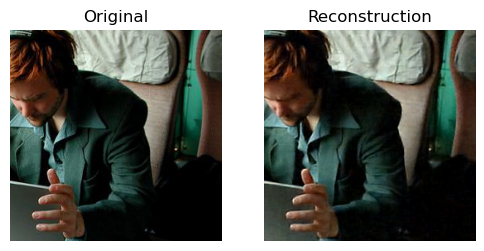

Training:  84%|███████████████████████████████████████████████████▉          | 33500/40000 [6:00:15<1:09:53,  1.55it/s]


[Step 33500] Loss: 1.4909 | 
MSE: 0.001889 | Reconstruction MSE: 0.001877 | PSNR: 27.266380 | Vision MSE: 0.128604 | 
BPP: 0.523492 | Ry1: 0.344337 | Ry2: 0.168369 | Ry: 0.512705 | Rz: 0.010786 | 
Total Bits: 34307.5430 | Base Bits: 22566.4512 | Enhacement Bits: 11034.2031 | Side Information Bits: 706.8881
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0015 | std: 1.1894 | range: -23.8045 - 25.5472
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0014 | std: 1.2243 | range: -24.2139 - 25.6422
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0012 | std: 1.4047 | range: -24.2139 - 25.6422
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0018 | std: 0.7417 | range: -14.2115 - 13.3725
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2303 | std: 0.8802 | range: -14.

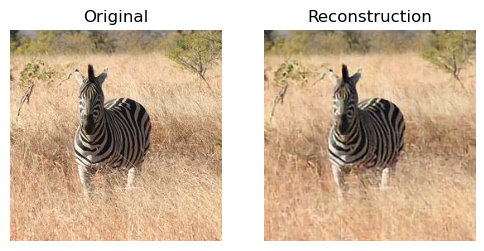

Training:  85%|████████████████████████████████████████████████████▋         | 34000/40000 [6:05:38<1:04:40,  1.55it/s]


[Step 34000] Loss: 1.1546 | 
MSE: 0.001293 | Reconstruction MSE: 0.001281 | PSNR: 28.923897 | Vision MSE: 0.122752 | 
BPP: 0.492333 | Ry1: 0.319830 | Ry2: 0.162294 | Ry: 0.482125 | Rz: 0.010209 | 
Total Bits: 32265.5625 | Base Bits: 20960.4043 | Enhacement Bits: 10636.1123 | Side Information Bits: 669.0470
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -14.6896 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.5369 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0125 | std: 1.0972 | range: -20.8470 - 25.2210
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0117 | std: 1.1352 | range: -21.3145 - 25.6531
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0168 | std: 1.2715 | range: -21.3145 - 25.6531
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0015 | std: 0.7950 | range: -19.3870 - 15.8137
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2354 | std: 0.8739 | range: 

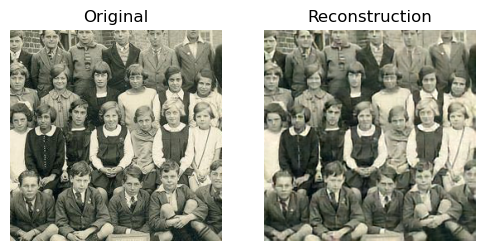

Training:  86%|███████████████████████████████████████████████████████▏        | 34500/40000 [6:11:01<59:14,  1.55it/s]


[Step 34500] Loss: 1.1794 | 
MSE: 0.001395 | Reconstruction MSE: 0.001384 | PSNR: 28.589378 | Vision MSE: 0.113859 | 
BPP: 0.465058 | Ry1: 0.307663 | Ry2: 0.146368 | Ry: 0.454030 | Rz: 0.011028 | 
Total Bits: 30478.0469 | Base Bits: 20162.9883 | Enhacement Bits: 9592.3506 | Side Information Bits: 722.7092
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.5910 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0012 | std: 1.2190 | range: -24.7657 - 27.1062
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0010 | std: 1.2524 | range: -25.1341 - 27.1702
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0009 | std: 1.4497 | range: -25.1341 - 27.1702
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0012 | std: 0.7088 | range: -17.2625 - 18.3707
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2375 | std: 0.8918 | range: -12.5

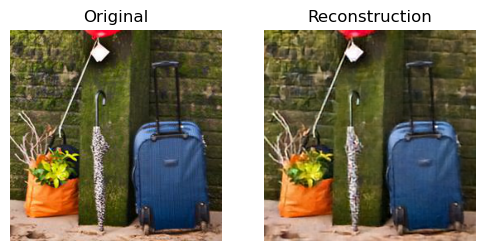

Training:  88%|████████████████████████████████████████████████████████        | 35000/40000 [6:16:25<53:47,  1.55it/s]


[Step 35000] Loss: 1.4262 | 
MSE: 0.001743 | Reconstruction MSE: 0.001730 | PSNR: 27.620218 | Vision MSE: 0.132560 | 
BPP: 0.533817 | Ry1: 0.350640 | Ry2: 0.172336 | Ry: 0.522975 | Rz: 0.010842 | 
Total Bits: 34984.2383 | Base Bits: 22979.5117 | Enhacement Bits: 11294.2051 | Side Information Bits: 710.5203
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.9424 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0153 | std: 1.2367 | range: -23.2594 - 24.3499
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0154 | std: 1.2705 | range: -23.4036 - 23.8839
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0217 | std: 1.4545 | range: -23.4036 - 23.8839
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0029 | std: 0.7817 | range: -16.5520 - 14.4692
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2348 | std: 0.9021 | range: 

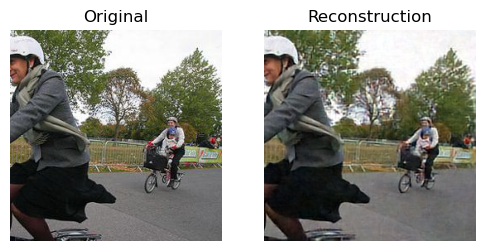

Training:  89%|████████████████████████████████████████████████████████▊       | 35500/40000 [6:21:48<48:32,  1.55it/s]


[Step 35500] Loss: 1.9689 | 
MSE: 0.002686 | Reconstruction MSE: 0.002672 | PSNR: 25.731865 | Vision MSE: 0.140612 | 
BPP: 0.593734 | Ry1: 0.385818 | Ry2: 0.196905 | Ry: 0.582723 | Rz: 0.011011 | 
Total Bits: 38910.9453 | Base Bits: 25284.9746 | Enhacement Bits: 12904.3398 | Side Information Bits: 721.6310
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.2492 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0021 | std: 1.2404 | range: -24.2834 - 24.5962
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0014 | std: 1.2733 | range: -24.0697 - 24.9681
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0003 | std: 1.4198 | range: -24.0697 - 24.9681
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0038 | std: 0.9122 | range: -21.6750 - 16.1593
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2325 | std: 0.9015 | range: 

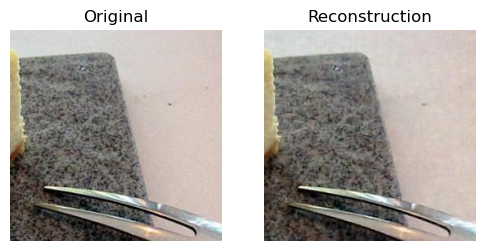

Training:  90%|█████████████████████████████████████████████████████████▌      | 36000/40000 [6:27:12<43:22,  1.54it/s]


[Step 36000] Loss: 1.0491 | 
MSE: 0.001170 | Reconstruction MSE: 0.001158 | PSNR: 29.361649 | Vision MSE: 0.120067 | 
BPP: 0.449905 | Ry1: 0.295786 | Ry2: 0.143754 | Ry: 0.439541 | Rz: 0.010365 | 
Total Bits: 29484.9980 | Base Bits: 19384.6602 | Enhacement Bits: 9421.0654 | Side Information Bits: 679.2734
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -12.3729 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -14.2376 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0047 | std: 1.2082 | range: -25.2527 - 30.8016
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0053 | std: 1.2419 | range: -25.4049 - 30.4605
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0065 | std: 1.4333 | range: -25.4049 - 30.4605
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0030 | std: 0.7198 | range: -16.6315 - 12.7483
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2290 | std: 0.8785 | range: -

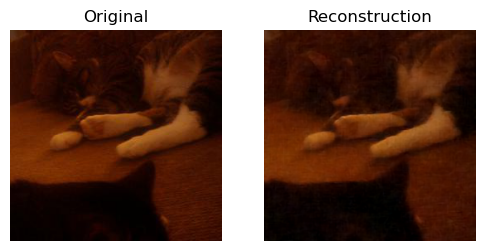

Training:  91%|██████████████████████████████████████████████████████████▍     | 36500/40000 [6:32:37<37:45,  1.54it/s]


[Step 36500] Loss: 1.5213 | 
MSE: 0.001803 | Reconstruction MSE: 0.001789 | PSNR: 27.474287 | Vision MSE: 0.138374 | 
BPP: 0.598351 | Ry1: 0.392018 | Ry2: 0.195178 | Ry: 0.587196 | Rz: 0.011155 | 
Total Bits: 39213.5039 | Base Bits: 25691.2754 | Enhacement Bits: 12791.1748 | Side Information Bits: 731.0567
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -15.2492 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0122 | std: 1.3362 | range: -29.7326 - 30.9494
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0122 | std: 1.3665 | range: -30.0082 - 30.6214
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0169 | std: 1.5636 | range: -30.0082 - 30.6214
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0027 | std: 0.8438 | range: -15.1345 - 15.9719
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2319 | std: 0.9122 | range: 

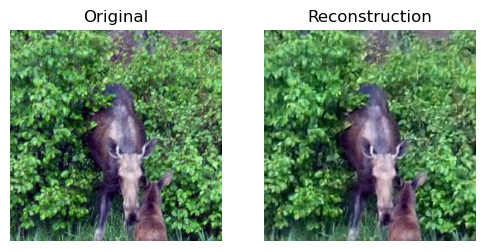

Training:  92%|███████████████████████████████████████████████████████████▏    | 37000/40000 [6:38:01<32:23,  1.54it/s]


[Step 37000] Loss: 1.3123 | 
MSE: 0.001553 | Reconstruction MSE: 0.001540 | PSNR: 28.123631 | Vision MSE: 0.130212 | 
BPP: 0.516927 | Ry1: 0.341767 | Ry2: 0.164026 | Ry: 0.505792 | Rz: 0.011134 | 
Total Bits: 33877.3203 | Base Bits: 22398.0117 | Enhacement Bits: 10749.6035 | Side Information Bits: 729.7033
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -17.3287 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -14.6896 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0065 | std: 1.3093 | range: -25.4651 - 26.7837
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0063 | std: 1.3400 | range: -25.0722 - 26.5794
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0111 | std: 1.5529 | range: -25.0722 - 26.5794
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0031 | std: 0.7510 | range: -13.0723 - 17.9334
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2398 | std: 0.9198 | range: -15

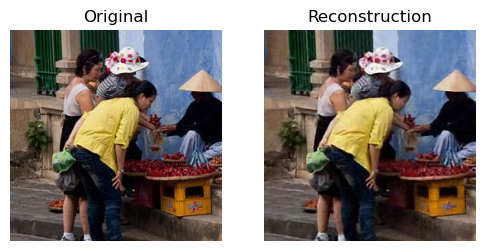

Training:  94%|████████████████████████████████████████████████████████████    | 37500/40000 [6:43:24<26:57,  1.55it/s]


[Step 37500] Loss: 1.5556 | 
MSE: 0.001981 | Reconstruction MSE: 0.001968 | PSNR: 27.059336 | Vision MSE: 0.127757 | 
BPP: 0.541396 | Ry1: 0.358376 | Ry2: 0.172107 | Ry: 0.530483 | Rz: 0.010913 | 
Total Bits: 35480.9453 | Base Bits: 23486.5176 | Enhacement Bits: 11279.2256 | Side Information Bits: 715.2018
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -15.2492 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -11.5056 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0006 | std: 1.3587 | range: -27.1986 - 27.0065
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0002 | std: 1.3897 | range: -27.1024 - 26.7318
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0003 | std: 1.6154 | range: -27.1024 - 26.7318
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0012 | std: 0.7582 | range: -12.9977 - 16.0773
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2431 | std: 0.9047 | range: -17

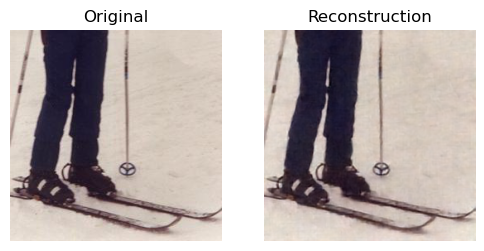

Training:  95%|████████████████████████████████████████████████████████████▊   | 38000/40000 [6:48:48<21:35,  1.54it/s]


[Step 38000] Loss: 1.6977 | 
MSE: 0.002188 | Reconstruction MSE: 0.002174 | PSNR: 26.627447 | Vision MSE: 0.135810 | 
BPP: 0.577649 | Ry1: 0.377331 | Ry2: 0.189874 | Ry: 0.567205 | Rz: 0.010444 | 
Total Bits: 37856.8047 | Base Bits: 24728.7871 | Enhacement Bits: 12443.5850 | Side Information Bits: 684.4283
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -13.8947 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -12.7540 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0054 | std: 1.2068 | range: -26.3993 - 26.1118
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0053 | std: 1.2407 | range: -25.9290 - 26.5891
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0065 | std: 1.4137 | range: -25.9290 - 26.5891
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0030 | std: 0.7881 | range: -19.3813 - 12.9048
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2225 | std: 0.8827 | range: 

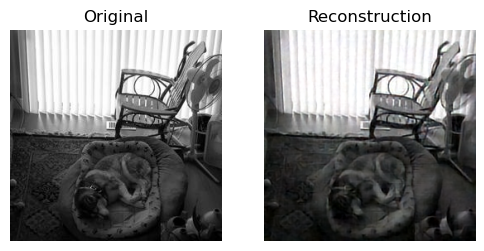

Training:  96%|█████████████████████████████████████████████████████████████▌  | 38500/40000 [6:54:12<16:09,  1.55it/s]


[Step 38500] Loss: 1.1011 | 
MSE: 0.001264 | Reconstruction MSE: 0.001253 | PSNR: 29.022005 | Vision MSE: 0.110307 | 
BPP: 0.454137 | Ry1: 0.299282 | Ry2: 0.143598 | Ry: 0.442881 | Rz: 0.011256 | 
Total Bits: 29762.2988 | Base Bits: 19613.7637 | Enhacement Bits: 9410.8594 | Side Information Bits: 737.6756
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -11.9911 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0194 | std: 1.1821 | range: -19.4340 - 24.4452
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0195 | std: 1.2163 | range: -19.8568 - 24.6191
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0287 | std: 1.4186 | range: -19.8568 - 24.6191
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: -0.0011 | std: 0.6426 | range: -11.9451 - 11.6262
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2438 | std: 0.8858 | range: -

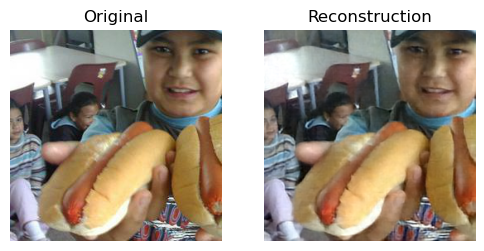

Training:  98%|██████████████████████████████████████████████████████████████▍ | 39000/40000 [6:59:35<10:48,  1.54it/s]


[Step 39000] Loss: 0.8926 | 
MSE: 0.000971 | Reconstruction MSE: 0.000960 | PSNR: 30.175446 | Vision MSE: 0.107340 | 
BPP: 0.395427 | Ry1: 0.259300 | Ry2: 0.125472 | Ry: 0.384772 | Rz: 0.010655 | 
Total Bits: 25914.7148 | Base Bits: 16993.4941 | Enhacement Bits: 8222.9121 | Side Information Bits: 698.3088
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -13.2343 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0006 | std: 1.1702 | range: -27.3741 - 22.1055
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0008 | std: 1.2051 | range: -27.8418 - 21.7460
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0008 | std: 1.3976 | range: -27.8418 - 21.7460
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0007 | std: 0.6712 | range: -14.3749 - 14.7992
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2441 | std: 0.8896 | range: -14.9

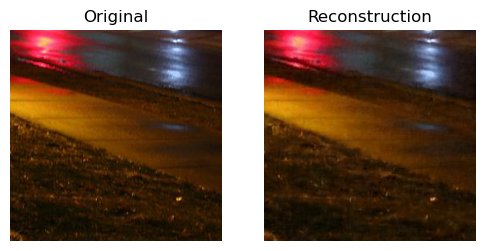

Training:  99%|███████████████████████████████████████████████████████████████▏| 39500/40000 [7:04:59<05:22,  1.55it/s]


[Step 39500] Loss: 2.4107 | 
MSE: 0.003452 | Reconstruction MSE: 0.003437 | PSNR: 24.638073 | Vision MSE: 0.146114 | 
BPP: 0.643447 | Ry1: 0.422071 | Ry2: 0.210966 | Ry: 0.633037 | Rz: 0.010410 | 
Total Bits: 42168.9648 | Base Bits: 27660.8633 | Enhacement Bits: 13825.8408 | Side Information Bits: 682.2611
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -27.6310 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: 0.0045 | std: 1.1921 | range: -26.0139 - 32.9725
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: 0.0044 | std: 1.2276 | range: -25.7747 - 33.3903
Base Variable y1 | shape: (8, 128, 16, 16) | mean: 0.0061 | std: 1.3823 | range: -25.7747 - 33.3903
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0012 | std: 0.8362 | range: -15.7872 - 17.4395
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2222 | std: 0.8851 | range: -12.

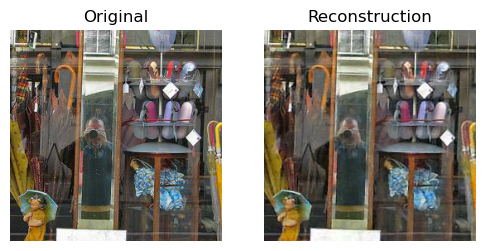

Training: 100%|████████████████████████████████████████████████████████████████| 40000/40000 [7:10:23<00:00,  1.54it/s]


[Step 40000] Loss: 1.4916 | 
MSE: 0.001848 | Reconstruction MSE: 0.001834 | PSNR: 27.364925 | Vision MSE: 0.130740 | 
BPP: 0.545622 | Ry1: 0.358251 | Ry2: 0.176335 | Ry: 0.534586 | Rz: 0.011036 | 
Total Bits: 35757.8789 | Base Bits: 23478.3672 | Enhacement Bits: 11556.2793 | Side Information Bits: 723.2322
Total parameters: 23,439,651
Log_Probabilites logp_y1 | shape: (8, 128, 16, 16) | min: -27.6310 | max: 0.0000
Log_Probabilites logp_y2 | shape: (8, 64, 16, 16) | min: -14.5561 | max: 0.0000
Latent Variable y | shape: (8, 192, 16, 16) | mean: -0.0068 | std: 1.1776 | range: -24.5146 - 28.2478
Qantized Variable y_hat | shape: (8, 192, 16, 16) | mean: -0.0064 | std: 1.2127 | range: -24.2173 - 27.9108
Base Variable y1 | shape: (8, 128, 16, 16) | mean: -0.0097 | std: 1.3858 | range: -24.2173 - 27.9108
Enhacement Variable y2 | shape: (8, 64, 16, 16) | mean: 0.0003 | std: 0.7555 | range: -16.0399 - 14.9280
Feature Variable F | shape: (8, 256, 32, 32) | mean: -0.2387 | std: 0.9023 | range: -

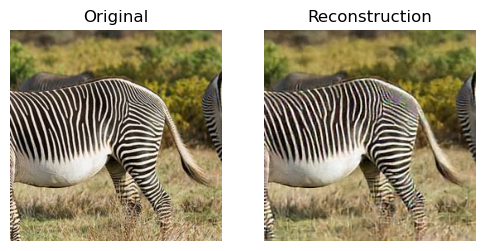

Training: 100%|████████████████████████████████████████████████████████████████| 40000/40000 [7:10:24<00:00,  1.55it/s]


In [7]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = ScalableImageCoding(latent_channels=192, base_channels=128, K=1).to(device)

optimizer = optim.Adam(model.parameters(), lr=1e-4)
lambda_val = 512 # trade-off  [32, 64, 128, 256, 512, 1024, 2048]  # use small lambda when no 255**2 is in the loss function 
gamma = 1e-4

# --- Training hyperparams ---
max_steps = 40000  # total training steps (not epochs)
log_interval = 500  # steps between smoke test logging
plots_interval = 100 # steps between data points for plots
H_y = []
H_y1 = []
H_y2 = []
F_MSE = []
X_MSE = []
X_PSNR = []

step = 0
model.train()
train_iter = iter(train_loader)  # iterator over dataset

pbar = tqdm(total=max_steps, desc="Training")

while step < max_steps:
    try:
        imgs = next(train_iter)
    except StopIteration:
        # restart the iterator when we reach end of dataset
        train_iter = iter(train_loader)
        imgs = next(train_iter)

    imgs = imgs.to(device)
    optimizer.zero_grad()

    # Forward ( with debugging )
    #if step % (2*log_interval) == 0:
    #   model_out = model(imgs, debug=True)
    #else:    
    #   model_out = model(imgs)
    model_out = model(imgs)

    # Compute RD loss
    #results = rd_loss(model_out, imgs, lambda_val)
    results = vision_rd_loss(model_out, imgs, lambda_val, gamma=gamma, frozen_activation=activation_block, V=V)
    loss = results['loss']
    loss.backward()
    optimizer.step()

    step += 1
    pbar.update(1)

    if step % plots_interval == 0:
        H_y.append((step, results['bpp_y']))
        H_y1.append((step, results['bpp_y1']))
        H_y2.append((step, results['bpp_y2']))
        F_MSE.append((step, results['reconstruction_mse']))
        X_MSE.append((step, results['mse']))
        X_PSNR.append((step, results['psnr']))

    # Smoke test logging
    if step % log_interval == 0:
        print(f"\n[Step {step}] Loss: {loss.item():.4f} | ")
        print(f"MSE: {results['mse']:.6f} | "
              f"Reconstruction MSE: {results['reconstruction_mse']:.6f} | "
              f"PSNR: {results['psnr']:.6f} | "
              f"Vision MSE: {results['vision_mse']:.6f} | ")
        print(f"BPP: {results['bpp_total']:.6f} | "
              f"Ry1: {results['bpp_y1']:.6f} | "
              f"Ry2: {results['bpp_y2']:.6f} | "
              f"Ry: {results['bpp_y']:.6f} | "
              f"Rz: {results['bpp_z']:.6f} | ")
        print(f"Total Bits: {results['bits_total']:.4f} | "
              f"Base Bits: {results['bits_y1']:.4f} | "
              f"Enhacement Bits: {results['bits_y2']:.4f} | "
              f"Side Information Bits: {results['bits_z']:.4f}")


        # Print some key parameter stats
        with torch.no_grad():
            total_params = sum(p.numel() for p in model.parameters())
            print(f"Total parameters: {total_params:,}")
            print(f"Log_Probabilites logp_y1 | shape: {tuple(model_out['logp_y1'].shape)} | min: {model_out['logp_y1'].min().item():.4f} | max: {model_out['logp_y1'].max().item():.4f}")
            print(f"Log_Probabilites logp_y2 | shape: {tuple(model_out['logp_y2'].shape)} | min: {model_out['logp_y2'].min().item():.4f} | max: {model_out['logp_y2'].max().item():.4f}")
            print(f"Latent Variable y | shape: {tuple(model_out['y'].shape)} | mean: {model_out['y'].mean().item():.4f} | std: {model_out['y'].std().item():.4f} | range: {model_out['y'].min().item():.4f} - {model_out['y'].max().item():.4f}")
            print(f"Qantized Variable y_hat | shape: {tuple(model_out['y_in'].shape)} | mean: {model_out['y_in'].mean().item():.4f} | std: {model_out['y_in'].std().item():.4f} | range: {model_out['y_in'].min().item():.4f} - {model_out['y_in'].max().item():.4f}")
            print(f"Base Variable y1 | shape: {tuple(model_out['y1'].shape)} | mean: {model_out['y1'].mean().item():.4f} | std: {model_out['y1'].std().item():.4f} | range: {model_out['y1'].min().item():.4f} - {model_out['y1'].max().item():.4f}")
            print(f"Enhacement Variable y2 | shape: {tuple(model_out['y2'].shape)} | mean: {model_out['y2'].mean().item():.4f} | std: {model_out['y2'].std().item():.4f} | range: {model_out['y2'].min().item():.4f} - {model_out['y2'].max().item():.4f}")
            print(f"Feature Variable F | shape: {tuple(model_out['F_tilde'].shape)} | mean: {model_out['F_tilde'].mean().item():.4f} | std: {model_out['F_tilde'].std().item():.4f} | range: {model_out['F_tilde'].min().item():.4f} - {model_out['F_tilde'].max().item():.4f}")
            print(f"Entropy Parameter mu1 | shape: {tuple(model_out['mu1'].shape)} | mean: {model_out['mu1'].mean().item():.4f} | std: {model_out['mu1'].std().item():.4f}")
            print(f"Entropy Parameter sigma1 | shape: {tuple(model_out['sigma1'].shape)} | mean: {model_out['sigma1'].mean().item():.4f} | std: {model_out['sigma1'].std().item():.4f}")
            print(f"Entropy Parameter mu2 | shape: {tuple(model_out['mu2'].shape)} | mean: {model_out['mu2'].mean().item():.4f} | std: {model_out['mu2'].std().item():.4f}")
            print(f"Entropy Parameter sigma2 | shape: {tuple(model_out['sigma2'].shape)} | mean: {model_out['sigma2'].mean().item():.4f} | std: {model_out['sigma2'].std().item():.4f}")




        # Plot original vs reconstruction (pick random image from batch)
        idx = random.randint(0, imgs.size(0) - 1)
        orig = imgs[idx].detach().cpu().permute(1, 2, 0).numpy()
        recon = model_out['x_hat'][idx].detach().cpu().permute(1, 2, 0).numpy()

        fig, axs = plt.subplots(1, 2, figsize=(6, 3))
        axs[0].imshow(orig.clip(0, 1))
        axs[0].set_title("Original")
        axs[0].axis("off")
        axs[1].imshow(recon.clip(0, 1))
        axs[1].set_title("Reconstruction")
        axs[1].axis("off")
        plt.show()

pbar.close()

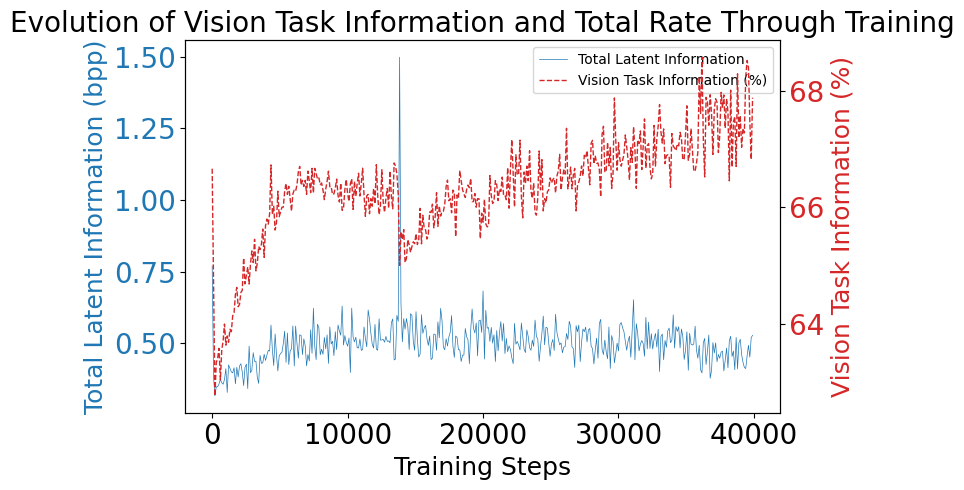

In [36]:
plot_information_evolution(H_y, H_y1)

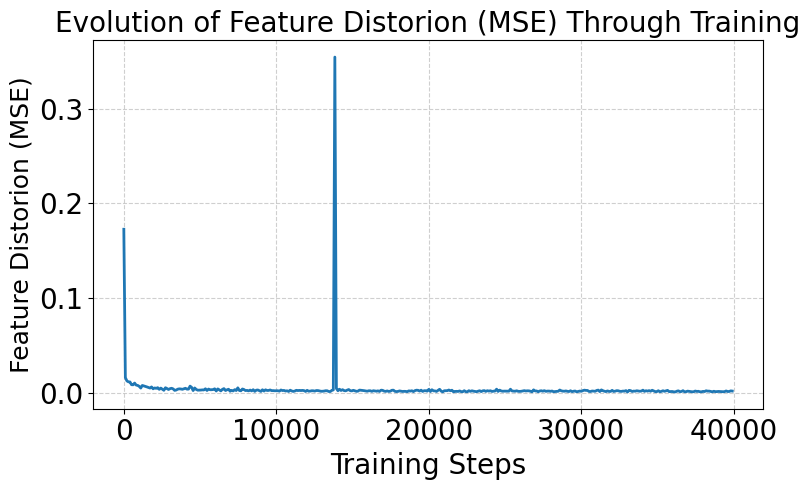

In [42]:
plot_metric_evolution(F_MSE, y_label="Feature Distorion (MSE)")

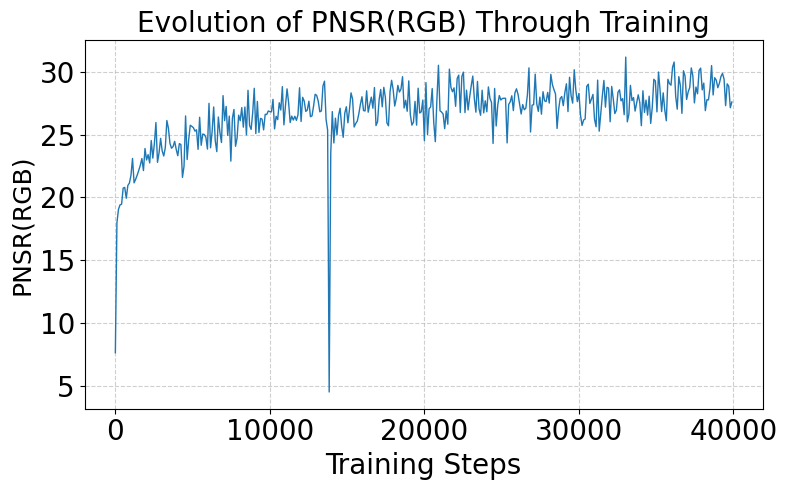

In [40]:
plot_metric_evolution(X_PSNR, y_label="PNSR(RGB)")

### Evaluation

In [11]:
transform_test = transforms.Compose([
    transforms.ToTensor(),
])

kodak_dir = "./kodak"
test_dataset = KodakDataset(kodak_dir, transform=transform_test)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

In [12]:
evaluator = VisionCompressionEvaluator(model, test_loader, device, lambda_val, gamma)
avg_metrics, imgs_list, recon_list = evaluator.evaluate(vision_rd_loss)


--- Evaluation Results ---
MSE(255): 71.664396
PSNR(RGB): 30.177162
MS-SSIM(RGB): 0.962214
PSNR(Y): 30.760508
MS-SSIM(Y): 0.969488
BPP: 0.384496
BPP(y): 0.384496
BPP(y1): 0.261460
BPP(y2): 0.123036
BPP(z): 0.008671


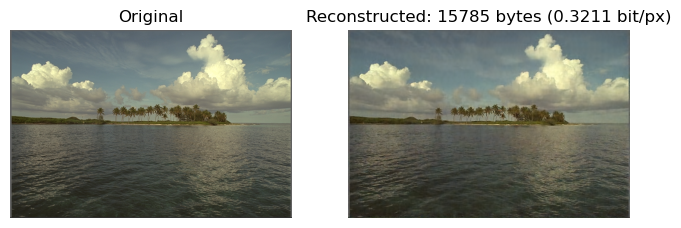

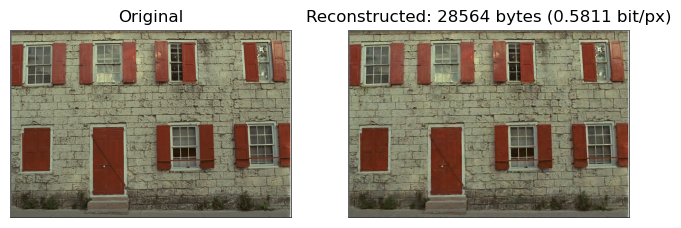

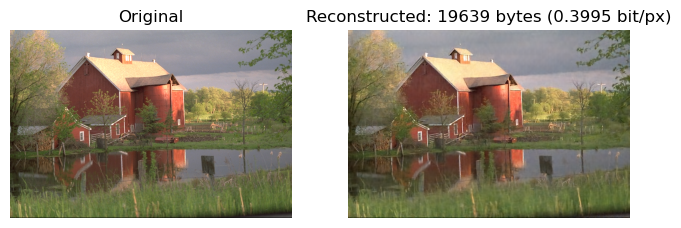

In [15]:
evaluator.plot_samples(imgs_list, recon_list, vision_rd_loss, n=3)

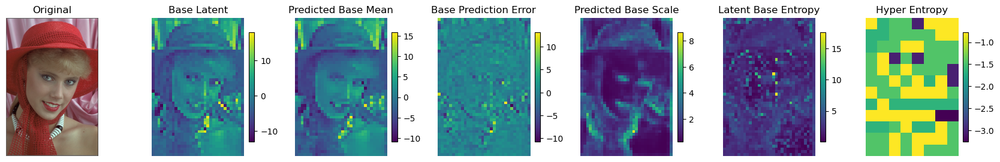

In [14]:
evaluator.plot_high_entropy_channel(imgs_list, latent_idx=1)